In [1]:
import sys, os, time, shutil, random
# os.environ['PLETHORA_PATH'] = '/is/ei/fleeb/workspace/local_data'

from pathlib import Path
# _cwd = os.getcwd()
# os.chdir(Path(_cwd)/'..')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))
%load_ext autoreload
%autoreload 2
# %pdb
from yaml import dump
import omnifig as fig
import numpy as np
np.set_printoptions(linewidth=120)
import pickle
from tabulate import tabulate
from tqdm.notebook import tqdm
from omnibelt import unspecified_argument
import torch
from torch import nn
import torch.nn.functional as F
import torch.distributions as distrib
import torch.multiprocessing as mp
# import torchvision.models
from torch.utils.data import Dataset, DataLoader, TensorDataset
# import timm
torch.set_printoptions(linewidth=300, sci_mode=False)
%matplotlib notebook
import matplotlib.pyplot as plt
#plt.switch_backend('Qt5Agg') #('Qt5Agg')
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.cm
from matplotlib import animation
import matplotlib as mpl
# mpl.rc('image', cmap='gray')
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import normalize

# import gpumap
from c3linearize import linearize, class_graph

fig.initialize()

import omnilearn as learn
from omnilearn import models
from omnilearn import util
from omnilearn.data import InterventionSamplerBase

from sklearn.decomposition import PCA
import sklearn.datasets


# from src import sample_full_interventions, response_mat, factor_reponses
# from src.responses import sample_full_interventions

# fig.initialize('sae')
# from omnifig.projects import sae
# import networkx as nx

# # from src import sample_full_interventions, response_mat, factor_reponses
# dataset = None
# src = None

import torch.distributed as dist
import torch.nn as nn
import torch.optim as optim
import torch.multiprocessing as mp

from torch.nn.parallel import DistributedDataParallel as DDP
rank = 0
world_size = 1
init_method="file:///C:/Users/anwan/Documents/tmp/env"
# dist.init_process_group(
#    "gloo",
#    rank=rank,
#    init_method=init_method,
#    world_size=world_size)

from plethora import datasets
from plethora import tasks
from plethora import framework as fm

from model import AutoEncoder
import utils
# import datasets
import conditional_eval as elib
from conditional_eval import NVAE_Simple
import controller as ctr

2022-05-16 16:24:56.813971: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /is/ei/fleeb/miniconda3/lib/python3.8/site-packages/cv2/../../lib64:/is/ei/fleeb/.mujoco/mujoco200/bin
2022-05-16 16:24:56.813986: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [4]:
root = Path('/is/ei/fleeb/workspace/local_data/tasks/test-220516-164849/info_train')

In [5]:
m = torch.load(root / 'estimator.pt')
m

[GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 GradientBoostingClassifier(),
 Gradien

In [ ]:
m()

In [2]:
fig.initialize('sae')

Failed to import faiss
Unable to import lossless compression files (find the code at https://github.com/bits-back/bits-back)


In [3]:
fid = fig.quick_create('fid', dim=2048)
fid

| dim: 2048
| skip_load: False (by default)
| batch_size: 50 (by default)
| n_samples: 50000 (by default)
| ret_stats: True (by default)
| pbar: None (by default)
| device: 'cuda' (by default)
Loading inception model dim=2048


C:\Users\anwan\anaconda3\lib\site-packages\torchvision\models\inception.py:80: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn('The default weight initialization of inception_v3 will be changed in future releases of '


In [4]:
extractor = fm.Timm_Extractor('inception_v3', device='cuda')
extractor.eval()
extractor.to('cuda')

Timm_Extractor(
  (model): InceptionV3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a_3x3): Basi

In [7]:
et = tasks.generation.InceptionV3()
et.to('cuda')
# et

In [8]:
X = torch.rand(10, 3, 100, 100).cuda()

In [10]:
with torch.no_grad():
    z = extractor.extract(X.cuda().mul(2).sub(1))
    zf = et.extract(X.cuda())
z.shape

torch.Size([10, 2048])

In [11]:
from omnilearn.community.fid import apply_inception

In [12]:
fid.inception.eval();

In [13]:
with torch.no_grad():
#     z2 = fid.inception(X.cuda())
    z2 = apply_inception(X.cuda(), fid.inception)
z2.shape

torch.Size([10, 2048])

In [14]:
z2[0]

tensor([0.2498, 0.0000, 0.1132,  ..., 0.0420, 0.0497, 0.2777], device='cuda:0')

In [38]:
z[0]

tensor([0.6861, 0.0490, 0.0170,  ..., 0.4511, 0.1783, 0.0020], device='cuda:0')

In [51]:
# extractor.model

In [50]:
# fid.inception

In [56]:
from torch.nn import functional as F

In [18]:
with torch.no_grad():
    z3 = model(X)[0].squeeze()
z3.shape

torch.Size([10, 2048])

In [62]:
z3[0]

tensor([0.0520, 0.0000, 0.2658,  ..., 0.0540, 0.1112, 0.1354], device='cuda:0')

In [67]:
F.normalize(z, dim=-1).unsqueeze(1) @ F.normalize(z3, dim=-1).unsqueeze(-1)

tensor([[[0.2718]],

        [[0.2664]],

        [[0.2750]],

        [[0.2677]],

        [[0.2889]],

        [[0.2878]],

        [[0.2881]],

        [[0.2626]],

        [[0.2966]],

        [[0.2863]]], device='cuda:0')

In [16]:
from pytorch_fid.inception import InceptionV3
from torch.nn.functional import adaptive_avg_pool2d

In [17]:

block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]

model = InceptionV3([block_idx], use_fid_inception =True).to('cuda')
model.eval();

In [21]:
F.normalize(zf, dim=-1).unsqueeze(1) @ F.normalize(z3, dim=-1).unsqueeze(-1)

tensor([[[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]],

        [[1.0000]]], device='cuda:0')

In [65]:
import piq

In [7]:
from pytorch_fid import fid_score

In [8]:
fid_score.calculate_frechet_distance?

In [2]:
imgroot = Path('figures')
imgroot.mkdir(exist_ok=True)

In [26]:
dname = 'celeba_64'
dname = 'mnist'
# dname = 'cifar10'

In [59]:
F.normalize(z3, dim=-1).unsqueeze(1) @ F.normalize(z2, dim=-1).unsqueeze(-1)

tensor([[[0.2718]],

        [[0.2664]],

        [[0.2750]],

        [[0.2677]],

        [[0.2889]],

        [[0.2878]],

        [[0.2881]],

        [[0.2626]],

        [[0.2966]],

        [[0.2863]]], device='cuda:0')

In [27]:
if dname == 'mnist':
    bsnum = 24
    mbsnum = 200
#     dataset = fig.quick_run('load-data', name='mnist', batch_size=bsnum, seed=11)
    dataset = datasets.MNIST().prepare()
elif dname == 'cifar10':
    bsnum = 24
    mbsnum = 200
#     dataset = fig.quick_run('load-data', name='cifar10', batch_size=bsnum, seed=11)
    dataset = datasets.CIFAR10().prepare()
elif dname == 'celeba_64':
    bsnum = 12
    mbsnum = 60
#     dataset = fig.quick_run('load-data', name='celeba', batch_size=bsnum, seed=11, size=64, **{'_dataset_mod': 'interpolated'})
    dataset = datasets.CelebA(resize=64 if '64' in dname else None).prepare()
else:
    assert False
dataset

mnist[60000]

In [29]:
trainset, valset = dataset.split([None, 0.1])
trainset, valset

(mnist[54000], mnist[6000])

In [30]:
imgs = valset.get_observation()
imgs.shape

torch.Size([6000, 1, 32, 32])

In [31]:
dataset.split(shuffle=True)

In [33]:
torch.Generator().initial_seed()

[autoreload of conditional_eval failed: Traceback (most recent call last):
  File "/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/is/ei/fleeb/miniconda3/lib/python3.8/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/is/ei/fleeb/miniconda3/lib/python3.8/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 604, in _exec
  File "<frozen importlib._bootstrap_external>", line 779, in exec_module
  File "<frozen importlib._bootstrap_external>", line 916, in get_code
  File "<frozen importlib._bootstrap_external>", line 846, in source_to_code
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/is/ei/fleeb/w

67280421310721

In [2]:
import torch

In [3]:
x = torch.randn(34)

In [13]:
gen = torch.Generator()
torch.randn(4, generator=gen)
gen.initial_seed()

67280421310721

In [9]:
x.type('float')

ValueError: invalid type: 'float'

In [1]:
import pythae

In [3]:
from pythae import models

In [8]:
from pythae.models.nn import benchmarks

In [10]:
from pythae.models.nn.benchmarks import celeba

In [11]:
celeba.Encoder_VAE_CELEBA

pythae.models.nn.benchmarks.celeba.Encoder_VAE_CELEBA

In [13]:
from pythae.models import VAE, VAEConfig

In [33]:
model_config = VAEConfig(input_dim=(3, 64, 64), latent_dim=10)

In [34]:
model_config

VAEConfig(name='VAEConfig', input_dim=(3, 64, 64), latent_dim=10, uses_default_encoder=True, uses_default_decoder=True, reconstruction_loss='mse')

In [35]:
enc = celeba.Encoder_VAE_CELEBA(model_config)
dec = celeba.Decoder_AE_CELEBA(model_config)
print(enc)
print(dec)

Encoder_VAE_CELEBA(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
  )
  (embedding): Linear(in_features=16384, out_features=10, bias=True)
  (log_var): Linear

In [27]:
import torch

In [36]:
X = torch.rand(10,3,64,64)
X.shape

torch.Size([10, 3, 64, 64])

In [37]:
with torch.no_grad():
    Z = enc(X)
Z.shape

AttributeError: 'ModelOutput' object has no attribute 'shape'

In [39]:
Z['embedding']

tensor([[-3.3725e-02,  1.1009e-01, -2.4419e-01, -3.4219e-02, -7.3790e-03,
          1.4332e-01,  6.6389e-02, -7.5208e-01, -8.1619e-01, -1.0766e-01],
        [-3.6462e-01, -2.1410e-01,  2.6747e-01,  1.7692e-01,  4.7534e-01,
          8.9576e-04, -5.4456e-01, -6.8165e-01, -5.3706e-01, -6.9874e-02],
        [-2.0696e-01,  2.2798e-01, -1.5238e-01,  5.9131e-01,  5.2346e-01,
          1.5829e-01, -2.4419e-01, -1.0414e-01, -5.9489e-04,  2.0043e-03],
        [-2.0065e-01, -1.0480e-01, -3.7048e-01, -1.2300e-01,  6.3553e-01,
          1.4649e-01,  4.5624e-01, -2.5692e-01, -6.9972e-01,  2.1633e-01],
        [ 9.8175e-02,  2.5800e-01, -4.8087e-02,  1.6307e-01,  8.1207e-02,
         -2.3024e-01,  4.1053e-01, -5.9821e-02, -8.5734e-01, -2.0714e-01],
        [ 2.6082e-01, -2.5910e-01, -3.8668e-02, -2.1254e-01,  3.9392e-01,
          1.6874e-01, -2.3319e-01, -3.2097e-01,  2.1421e-01,  9.9239e-02],
        [ 5.1250e-01,  1.0456e-01, -7.3097e-01,  5.4670e-01,  5.2430e-01,
         -4.6186e-01,  1.1817e-0

In [52]:
import sys, os
import time
import io
from tqdm.notebook import tqdm

In [45]:
sf = io.StringIO()
sf

In [56]:
itr = tqdm(range(100), desc='starting',file=sys.stdout)#, disable=True)

for i in itr:
    time.sleep(0.02)
    itr.set_description(f'msg from {i}')

starting:   0%|          | 0/100 [00:00<?, ?it/s]

In [55]:
sf.getvalue()

''

In [60]:
def gen(n):
    for i in range(n):
        yield i

In [62]:
g = gen(10)
g

<generator object gen at 0x7fca8d6a9190>

In [63]:
float('inf') // 100

nan

In [66]:
g = torch.Generator()
g.manual_seed(11)

In [67]:
g.initial_seed()

11

In [65]:
float.real

TypeError: descriptor 'is_integer' for 'float' objects doesn't apply to a 'int' object

In [41]:
import logging
from tqdm import trange
from tqdm.contrib.logging import logging_redirect_tqdm

LOG = logging.getLogger(__name__)

logging.basicConfig(level=logging.INFO)
with logging_redirect_tqdm():
    for i in trange(9):
        if i == 4:
            LOG.info("console logging redirected to `tqdm.write()`")
# logging restored

INFO:__main__:console logging redirected to `tqdm.write()`                                                                                  
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 3141.28it/s]

console logging redirected to `tqdm.write()`



In [40]:
import logging
from tqdm import tqdm, trange
import time

log = logging.getLogger(__name__)
log.setLevel(logging.INFO)
handler = logging.StreamHandler()
handler.setStream(tqdm) # <-- important
handler = log.addHandler(handler)

for i in trange(100):
    if i == 50:
        log.info("Half-way there!")
    time.sleep(0.01)

 51%|████████████████████████████████████████████████████                                                  | 51/100 [00:05<00:05,  9.66it/s]

Half-way there!



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:10<00:00,  9.86it/s]


In [5]:
batch = dataset.get_batch(batch_size=bsnum, gen=torch.Generator().manual_seed(11))
X, Y = batch['observation'], batch['target']
X.shape, Y.shape

(torch.Size([12, 3, 64, 64]), torch.Size([12, 40]))

<IPython.core.display.Javascript object>


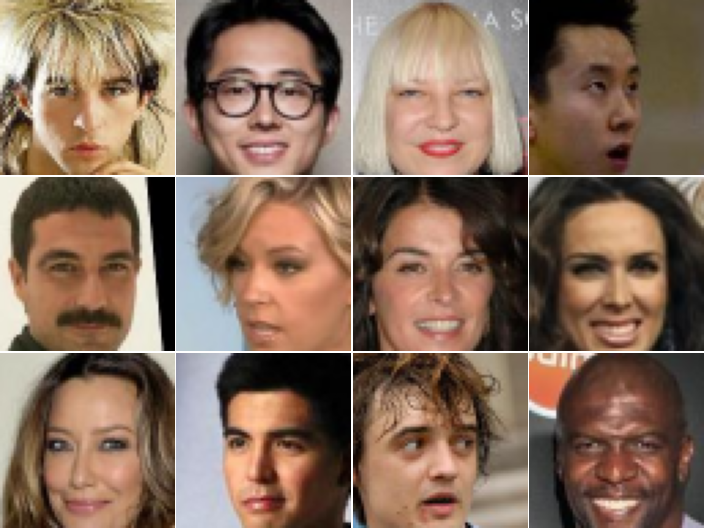

In [6]:
util.plot_imgs(X);

In [15]:
# model = elib.NVAE_Flat(dname=dname, num_dim=256**2)
# model = elib.NVAE_Flat(dname=dname, num_dim=1024)
# model = elib.NVAE_Flat(dname=dname, threshold=0.8)
model = elib.NVAE_Flat(dname=dname, num_dim=None, threshold=None)

len log norm: 730
len bn: 436


In [16]:
Z = model.encode(X)
prior = lambda N: torch.randn(N, Z.shape[-1])
rec = model.decode(Z)
Z.shape

torch.Size([12, 467200])

<IPython.core.display.Javascript object>


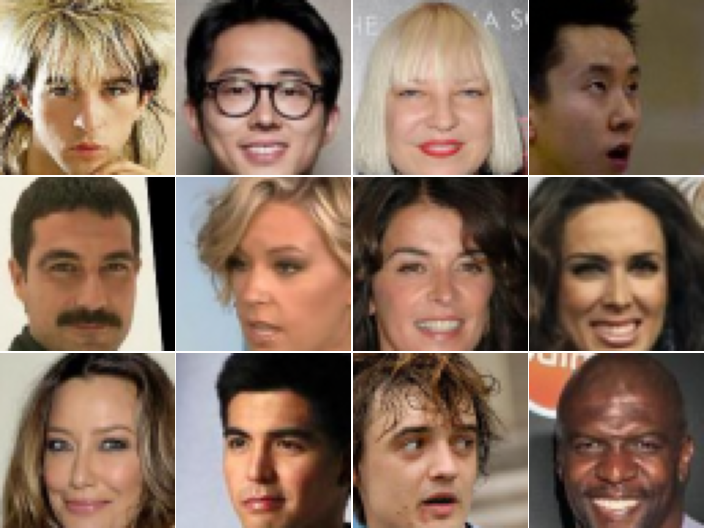

In [17]:
util.plot_imgs(rec);

In [11]:
# util.plot_imgs(model.decode(torch.randn_like(Z)*0.9));

In [11]:
Z = prior(12)
Z.shape

torch.Size([12, 23102])

In [12]:
Zs = [Z]
recs = [model.decode(Z)]

In [11]:
for _ in tqdm(range(5)):
    Zs.append(model.encode(recs[-1]))
    recs.append(model.decode(Zs[-1]))

/tmp/ipykernel_14566/4263850335.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for _ in tqdm(range(5)):


  0%|          | 0/5 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


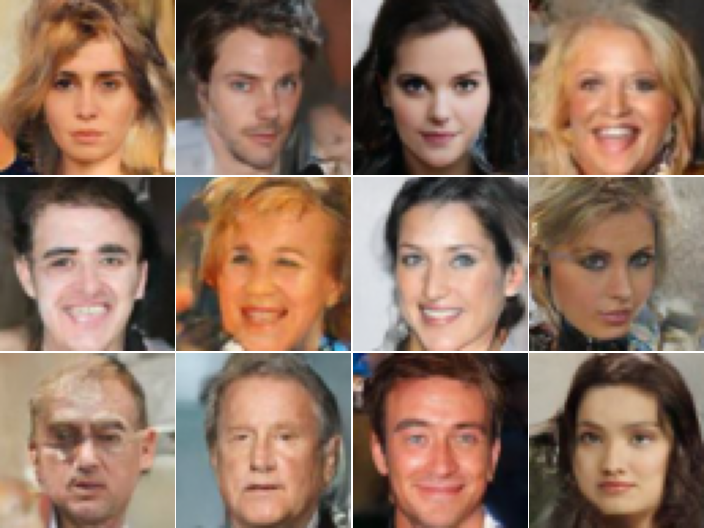

<IPython.core.display.Javascript object>


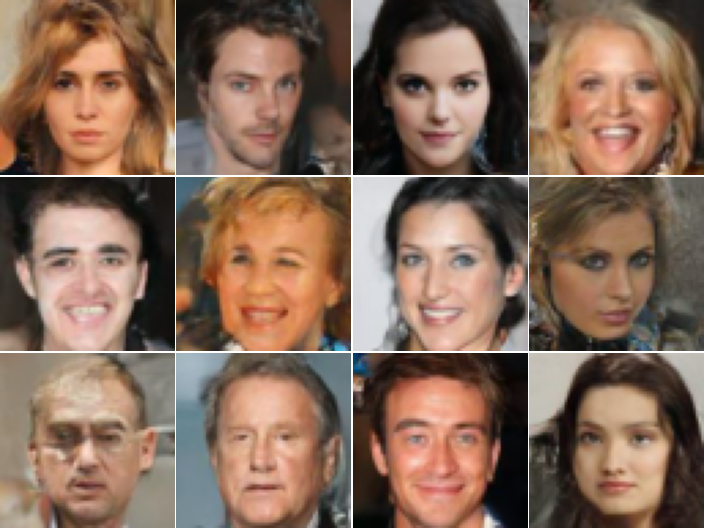

<IPython.core.display.Javascript object>


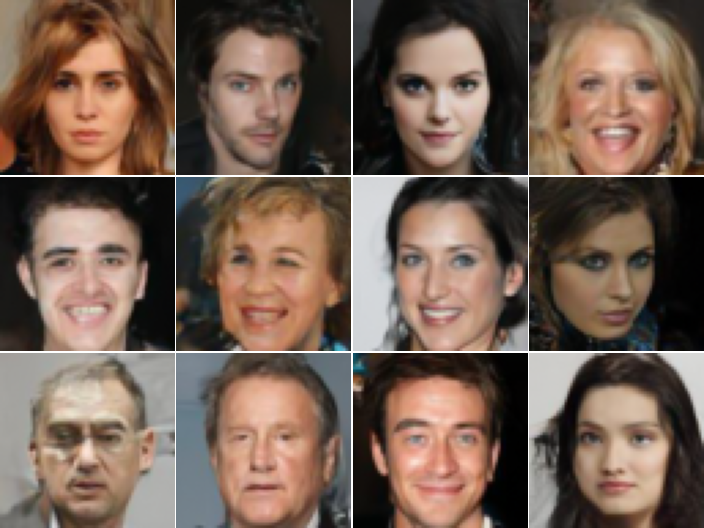

In [12]:
util.plot_imgs(recs[0]);
util.plot_imgs(recs[1]);
util.plot_imgs(recs[-1]);

In [11]:
extractor = fm.Timm_Extractor('inception_v3', device='cuda')

In [18]:
lrm = elib.ResponseModel(base=model, cycles=1)
lrm

<IPython.core.display.Javascript object>


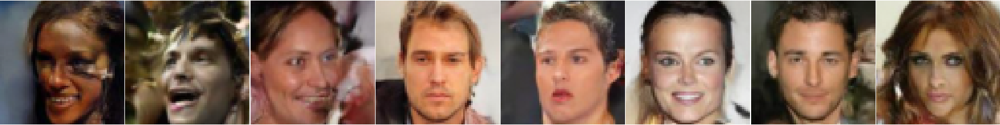

<IPython.core.display.Javascript object>


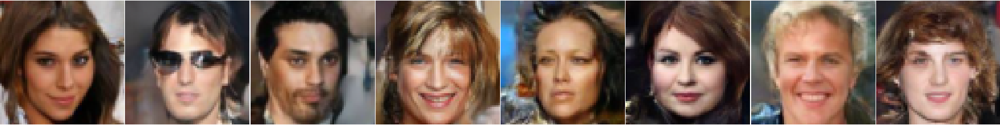

In [19]:
util.plot_imgs(model.sample(8), H=1);
util.plot_imgs(lrm.sample(8), H=1);

In [31]:
generator = model
# generator = rgen

In [32]:
# task = tasks.PR_GenerationTask(dataset=dataset, pbar=tqdm,
#                           num_samples=10000, batch_size=mbsnum,
#                           generator=model, extractor=extractor)

task = tasks.FID_GenerationTask(dataset=dataset, pbar=tqdm,
                          num_samples=10000, batch_size=mbsnum,
                          generator=generator, extractor=extractor)

In [33]:
with torch.no_grad():
    # out = task.compute(batch)
    # print(out['score'])

    out = task.compute()
    print(out['score'])

  0%|          | 0/10000 [00:00<?, ?it/s]

5.4749298095703125


In [30]:
# out2 = out

In [17]:
out['precision'], out['recall']

(0.42934131622314453, 0.6419161558151245)

In [20]:
# util.plot_imgs(out['generated']);
# util.plot_imgs(out['observation']);

In [34]:
out2['score']

5.80609130859375

In [35]:
out.keys()

odict_keys(['generated', 'fake', 'observation', 'real', 'fake_features', 'real_features', 'fake_fid_mu', 'fake_fid_cov', 'real_fid_mu', 'real_fid_cov', 'fid', 'score'])

In [24]:
# out['fake_fid_cov']#.shape

tensor([[ 0.0269,  0.0008,  0.0024,  ...,  0.0023,  0.0018,  0.0059],
        [ 0.0008,  0.0322,  0.0034,  ...,  0.0070,  0.0046,  0.0048],
        [ 0.0024,  0.0034,  0.0312,  ...,  0.0078,  0.0063, -0.0008],
        ...,
        [ 0.0023,  0.0070,  0.0078,  ...,  0.0653,  0.0066,  0.0034],
        [ 0.0018,  0.0046,  0.0063,  ...,  0.0066,  0.0630,  0.0073],
        [ 0.0059,  0.0048, -0.0008,  ...,  0.0034,  0.0073,  0.0657]])

In [14]:
Y.shape

torch.Size([12, 40])

In [30]:
Y

tensor([[0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
        [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0],
        [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 

In [15]:
# task.estimator.estimators[0].base_estimator

In [20]:
lin = nn.Linear(Z.shape[-1], Y.shape[-1])
lin

Linear(in_features=467200, out_features=40, bias=True)

In [22]:
with torch.no_grad():
    y = lin(Z)
y.shape

torch.Size([12, 40])

tensor([[    -0.0080,     -0.1021,     -0.0543,      0.0912,      0.0941,     -0.0416,     -0.0516,      0.0819,      0.0401,     -0.0909,     -0.0132,      0.0891,     -0.0293,      0.0100,      0.1523,     -0.0759,     -0.0542,     -0.0393,     -0.0948,     -0.0656,     -0.0504,      0.0544,
             -0.0456,     -0.0153,     -0.0674,      0.0302,     -0.1333,      0.0592,     -0.0048,      0.0116,      0.0166,     -0.1407,     -0.0528,     -0.2206,      0.2047,      0.0624,     -0.0264,      0.0535,      0.0233,     -0.0665],
        [     0.0621,     -0.1010,     -0.0065,     -0.0675,      0.1749,      0.0316,     -0.0805,     -0.1897,      0.0215,     -0.0789,      0.1247,      0.0173,     -0.1404,     -0.0406,      0.1803,     -0.0193,     -0.0040,      0.0675,      0.0502,      0.1110,     -0.0320,      0.0610,
             -0.0738,     -0.1198,     -0.0302,      0.0597,      0.0563,     -0.0232,      0.0429,      0.0178,     -0.0068,     -0.0684,     -0.0227,      0.0163,  

In [12]:
task = tasks.InferenceTask(dataset=dataset, pbar=tqdm, num_samples=1000,
	                          encoder=lrm)

In [13]:
with torch.no_grad():
    # out = task.compute(batch)
    # print(out['score'])

    out = task.compute()
    print(out['score'])

fit:   0%|          | 0/40 [00:00<?, ?it/s]

evaluate:   0%|          | 0/40 [00:00<?, ?it/s]

/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/is/ei/fleeb/miniconda3/lib/

0.5426562577135832


In [16]:
out.keys()

[autoreload of plethora.tasks.inference.task failed: Traceback (most recent call last):
  File "/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/is/ei/fleeb/miniconda3/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 287, in update_class
    old_obj = getattr(old, key)
  File "/is/ei/fleeb/workspace/code/projects/plethora/plethora/framework/hyperparameters.py", line 114, in __get__
    return self.get_value(obj, cls=cls)
  File "/is/ei/fleeb/workspace/code/projects/plethora/plethora/framework/hyperparameters.py", line 145, in get_value
    value = self._custom_getter

odict_keys(['individuals', 'score', 'train_score'])

In [14]:

rows = []
for n, o in zip(task.estimator.dout.names, out['individuals']):
#     print(o['report'])
    rows.append((n, o['report']['accuracy'], o['report']['macro avg'].get('f1-score'), {k:v['support'] for k,v in o['report'].items() if k in {0,1}}))
print(tabulate(rows))

-------------------  -----  --------  ---------------
5_o_Clock_Shadow     0.845  0.457995  {0: 172, 1: 28}
Arched_Eyebrows      0.72   0.554069  {0: 148, 1: 52}
Attractive           0.73   0.729024  {0: 98, 1: 102}
Bags_Under_Eyes      0.825  0.502806  {0: 164, 1: 36}
Bald                 0.985  0.496222  {0: 199, 1: 1}
Bangs                0.865  0.498095  {0: 174, 1: 26}
Big_Lips             0.725  0.468059  {0: 147, 1: 53}
Big_Nose             0.755  0.430199  {0: 153, 1: 47}
Black_Hair           0.76   0.501661  {0: 153, 1: 47}
Blond_Hair           0.82   0.476592  {0: 166, 1: 34}
Blurry               0.93   0.481865  {0: 191, 1: 9}
Brown_Hair           0.76   0.451429  {0: 154, 1: 46}
Bushy_Eyebrows       0.855  0.460916  {0: 176, 1: 24}
Chubby               0.945  0.485861  {0: 191, 1: 9}
Double_Chin          0.965  0.491094  {0: 195, 1: 5}
Eyeglasses           0.92   0.479167  {0: 186, 1: 14}
Goatee               0.93   0.481865  {0: 188, 1: 12}
Gray_Hair            0.96   0.48

In [ ]:
# model overall 0.5507922535404964
# -------------------  -----  --------  ---------------
# 5_o_Clock_Shadow     0.865  0.463807  {0: 174, 1: 26}
# Arched_Eyebrows      0.765  0.606217  {0: 151, 1: 49}
# Attractive           0.72   0.718621  {0: 96, 1: 104}
# Bags_Under_Eyes      0.78   0.459592  {0: 157, 1: 43}
# Bald                 0.965  0.491094  {0: 195, 1: 5}
# Bangs                0.81   0.472222  {0: 167, 1: 33}
# Big_Lips             0.73   0.484634  {0: 146, 1: 54}
# Big_Nose             0.805  0.470073  {0: 161, 1: 39}
# Black_Hair           0.735  0.473135  {0: 147, 1: 53}
# Blond_Hair           0.835  0.570061  {0: 165, 1: 35}
# Blurry               0.95   0.570447  {0: 190, 1: 10}
# Brown_Hair           0.805  0.445983  {0: 165, 1: 35}
# Bushy_Eyebrows       0.845  0.457995  {0: 171, 1: 29}
# Chubby               0.92   0.479167  {0: 186, 1: 14}
# Double_Chin          0.96   0.589744  {0: 194, 1: 6}
# Eyeglasses           0.945  0.619048  {0: 189, 1: 11}
# Goatee               0.94   0.484536  {0: 189, 1: 11}
# Gray_Hair            0.955  0.488491  {0: 192, 1: 8}
# Heavy_Makeup         0.78   0.766553  {0: 120, 1: 80}
# High_Cheekbones      0.7    0.699519  {0: 101, 1: 99}
# Male                 0.72   0.696181  {0: 109, 1: 91}
# Mouth_Slightly_Open  0.83   0.829728  {0: 106, 1: 94}
# Mustache             0.955  0.488491  {0: 192, 1: 8}
# Narrow_Eyes          0.855  0.460916  {0: 171, 1: 29}
# No_Beard             0.855  0.588039  {0: 33, 1: 167}
# Oval_Face            0.705  0.494841  {0: 143, 1: 57}
# Pale_Skin            0.965  0.491094  {0: 194, 1: 6}
# Pointy_Nose          0.725  0.574287  {0: 140, 1: 60}
# Receding_Hairline    0.89   0.547511  {0: 179, 1: 21}
# Rosy_Cheeks          0.915  0.572811  {0: 182, 1: 18}
# Sideburns            0.915  0.477807  {0: 185, 1: 15}
# Smiling              0.85   0.85      {0: 96, 1: 104}
# Straight_Hair        0.74   0.425287  {0: 149, 1: 51}
# Wavy_Hair            0.655  0.536897  {0: 138, 1: 62}
# Wearing_Earrings     0.84   0.555556  {0: 164, 1: 36}
# Wearing_Hat          0.9    0.473684  {0: 186, 1: 14}
# Wearing_Lipstick     0.78   0.779912  {0: 108, 1: 92}
# Wearing_Necklace     0.86   0.462366  {0: 172, 1: 28}
# Wearing_Necktie      0.89   0.470899  {0: 181, 1: 19}
# Young                0.8    0.444444  {0: 34, 1: 166}
# -------------------  -----  --------  ---------------

In [ ]:
out['train_score']

In [12]:
out.keys()

odict_keys(['observation', 'target', 'pred', 'probs', 'roc-auc', 'f1', 'precision', 'recall', 'worst-roc-auc', 'worst-f1', 'worst-precision', 'worst-recall', 'full-roc-auc', 'full-f1', 'full-recall', 'full-precision', 'full-support', 'report', 'confusion', 'accuracy', 'train_score', 'score'])

In [18]:
task.estimator.base_estimator.feature_importances_

array([0.28676107, 0.20594174, 0.02041575, 0.0179979 , 0.01129259, 0.00465247, 0.00994157, 0.00922365, 0.00351244,
       0.00554804, 0.00734043, 0.0034415 , 0.0055847 , 0.00793699, 0.00487379, 0.00390478, 0.00637198, 0.02022427,
       0.01067808, 0.00435049, 0.00238777, 0.00446645, 0.00442933, 0.00313475, 0.00867446, 0.00532765, 0.03090471,
       0.00738205, 0.0146192 , 0.02221439, 0.00138894, 0.00345034, 0.01233007, 0.00249032, 0.06397012, 0.00182565,
       0.00584925, 0.01342586, 0.01016077, 0.00322803, 0.00457836, 0.00908975, 0.00220778, 0.01012274, 0.00358724,
       0.02364888, 0.00769751, 0.00728258, 0.00791281, 0.00167692, 0.01098994, 0.02942326, 0.00587987, 0.00360076,
       0.00064727])

In [43]:
zs = torch.stack(Zs)
rs = torch.stack(recs)
zs.shape, rs.shape

(torch.Size([11, 12, 23000]), torch.Size([11, 12, 3, 64, 64]))

In [44]:
dts = zs[1:].sub(zs[:-1])
dts.shape

torch.Size([10, 12, 23000])

In [59]:
dts.norm(p=2,dim=-1)

tensor([[127.7128, 127.8183, 132.1927, 130.8170, 127.9009, 128.2197, 126.5463, 129.3087, 129.3439, 129.4596, 129.4718, 130.5565],
        [ 41.3572,  42.8133,  43.9176,  38.9411,  40.4759,  40.8191,  41.7767,  38.1292,  45.9273,  43.6730,  45.1036,  42.3371],
        [ 35.4428,  37.7767,  38.1973,  36.2503,  35.8343,  35.6323,  37.2666,  36.7744,  39.0419,  38.5269,  39.3011,  35.2716],
        [ 32.9141,  35.5160,  42.5023,  34.1599,  34.3524,  33.8262,  35.1174,  34.4058,  38.7757,  36.6772,  37.3253,  33.0612],
        [ 33.9279,  36.5231,  37.3200,  35.4398,  35.0906,  34.5277,  34.1356,  33.0473,  39.1214,  35.5227,  35.8606,  32.8201],
        [ 31.9093,  36.9533,  37.6024,  33.5032,  33.5706,  32.7711,  33.7090,  31.7434,  36.1024,  35.6065,  36.0874,  32.1306],
        [ 31.5740,  36.8725,  38.2183,  35.8882,  33.6195,  33.3725,  33.1156,  32.2513,  35.5723,  35.5642,  35.1455,  30.7571],
        [ 31.6732,  37.4599,  39.2024,  32.5378,  33.3651,  33.7403,  33.0219,  31.7091,  

In [57]:
v1, v2 = dts[1:], dts[:-1]
v1, v2 = F.normalize(v1,p=2,dim=-1), F.normalize(v2,p=2,dim=-1)
K,B, _ = v1.shape
v1.shape, v2.shape

(torch.Size([9, 12, 23000]), torch.Size([9, 12, 23000]))

In [58]:
v = v1.view(K*B,-1).unsqueeze(1).bmm(v2.view(K*B,-1).unsqueeze(-1)).squeeze().view(K,B)
v

tensor([[ 0.0169,  0.0239,  0.0154,  0.0510,  0.0222,  0.0143,  0.0451,  0.0153,  0.0098,  0.0025,  0.0043,  0.0312],
        [-0.0501, -0.0702, -0.0691, -0.0486, -0.0503, -0.0480, -0.0895, -0.0868, -0.0714, -0.0785, -0.0630, -0.1018],
        [-0.1353, -0.1451, -0.0934, -0.1898, -0.1348, -0.1292, -0.1416, -0.1763, -0.0952, -0.1130, -0.1443, -0.1017],
        [-0.1409, -0.1697, -0.1832, -0.1775, -0.1575, -0.1741, -0.1771, -0.2033, -0.1481, -0.1541, -0.1467, -0.1550],
        [-0.1927, -0.1962, -0.1602, -0.2104, -0.1858, -0.2254, -0.1754, -0.2043, -0.1851, -0.2091, -0.1641, -0.2420],
        [-0.1874, -0.2366, -0.1608, -0.1910, -0.1981, -0.2033, -0.2045, -0.2198, -0.1626, -0.2172, -0.2045, -0.2297],
        [-0.1996, -0.2124, -0.2585, -0.1919, -0.1966, -0.2205, -0.2137, -0.2328, -0.1885, -0.2038, -0.2013, -0.2621],
        [-0.2152, -0.1998, -0.2807, -0.2226, -0.2324, -0.2192, -0.2185, -0.2640, -0.2015, -0.2172, -0.2117, -0.2532],
        [-0.2399, -0.2518, -0.1751, -0.2481, -0.2114, -0

In [40]:
# util.plot_imgs(rs[:,-1]);

In [34]:
# model.calc_dim_spec(X, num_dim=None, threshold=0.5)

In [35]:
# model.calc_dim_spec(X, num_dim=20)

In [36]:
# model.calc_dim_spec(X, num_dim=20)

In [10]:
data = dataset.get_data()



if dname == 'celeba_64':
    
    target_attr = 'Blond_Hair'
#     target_attr = 'Black_Hair'
    # target_attr = 'Mustache'
#     target_attr = 'Wearing_Lipstick'
    # target_attr = 'Smiling'
    
    print(data._all_label_names)
    lbl_idx = data._all_label_names.index(target_attr)

    lbl_sel = data.attr[:, lbl_idx] == 1
    lbl_sel = torch.arange(len(lbl_sel))[lbl_sel]
elif dname == 'mnist':
    
    lbl_idx = 4
    
#     imgs = dataset.get_data().images

    lbl_sel = dataset.get_data().targets == lbl_idx
    lbl_sel = torch.arange(len(lbl_sel))[lbl_sel]


len(lbl_sel)

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


24267

In [11]:
N_base = 5

In [12]:
Xa = torch.stack([dataset.get_images(i) for i in lbl_sel[torch.randperm(len(lbl_sel))[:N_base]].tolist()])
Xa.shape

torch.Size([5, 3, 64, 64])

<IPython.core.display.Javascript object>


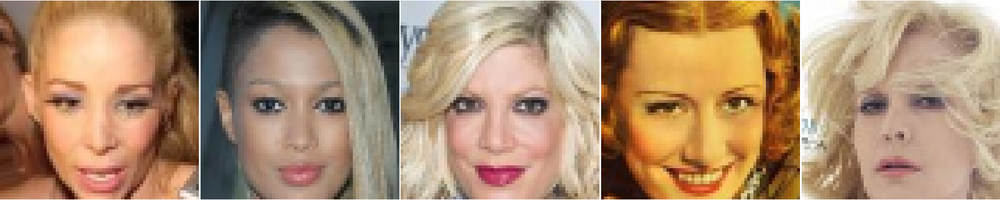

In [13]:
util.plot_imgs(Xa);

In [502]:
za = model.encode(Xa)
za.shape

torch.Size([5, 24])

<IPython.core.display.Javascript object>


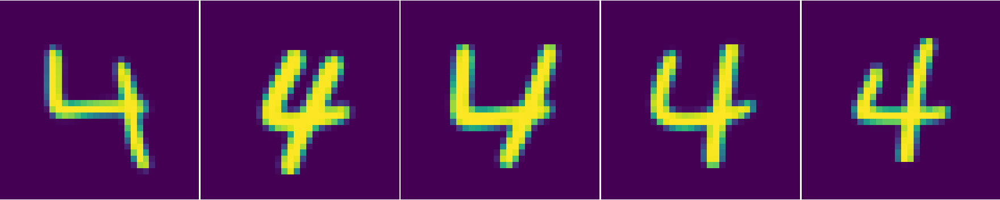

In [503]:
util.plot_imgs(model.decode(za));

In [328]:
# util.plot_parallel_coords(za.numpy(), );

In [520]:
lr = ctr.LatentResponse(encoder=model, decoder=model, temp=0.1, levels=2, n_neighbors=1, batch_size=100)
lr.fit(Xa);
# lz = lr.sample_latent(24)
# lz.shape
# lx = lr.decode(lz)
# lx.shape

<IPython.core.display.Javascript object>


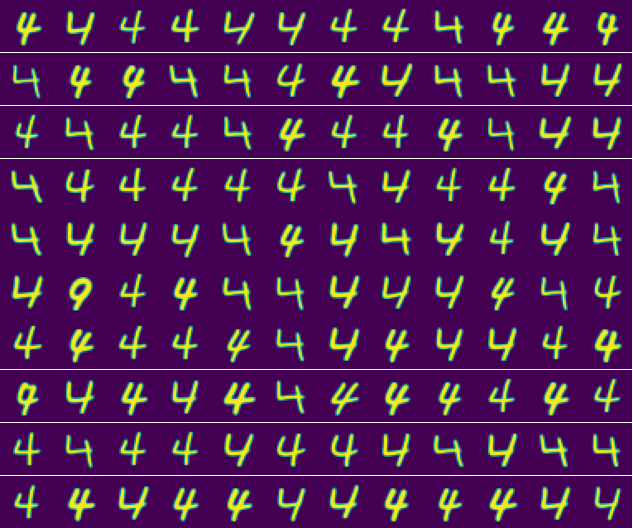

In [528]:
# # util.plot_imgs(lx);
util.plot_imgs(lr.sample(120));

In [524]:
self = lr

In [489]:
cands = self.generate_candidates(20)
cands.shape

torch.Size([20, 24])

<IPython.core.display.Javascript object>


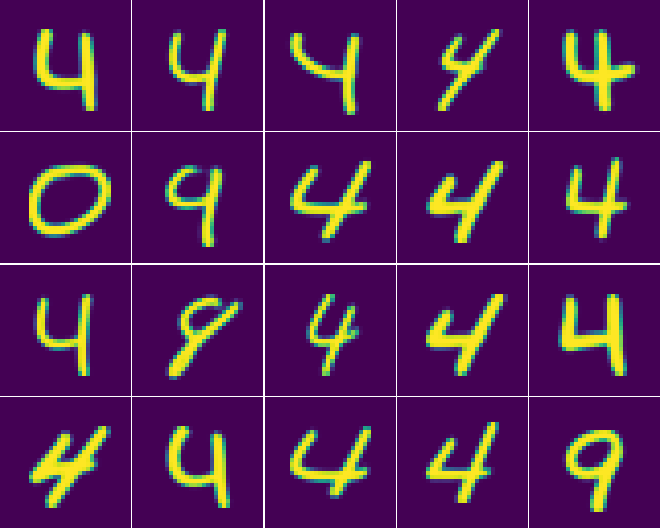

In [490]:
util.plot_imgs(lr.decode(cands));

In [491]:
self.nodes.sel.view(4,-1)

tensor([[ 4, 11,  7,  3,  8],
        [ 9,  1,  9, 16,  6],
        [11,  3,  0, 16, 10],
        [17,  4,  9, 18, 19]])

In [492]:
resps = self.process_levels(cands)
resps.shape

torch.Size([2, 20, 24])

In [493]:
agr = torch.cdist(resps, self.anchor_responses)
# dist, ident = agr.topk(self.n_neighbors, dim=-1, largest=False, sorted=True)

dn, identn = agr.topk(self.n_neighbors, dim=-1, largest=False, sorted=False)
dn = dn.mean(-1)

dist, ident = agr.min(dim=-1)
dist.shape, ident.shape

(torch.Size([2, 20]), torch.Size([2, 20]))

In [478]:
magr = torch.cdist(resps, self.anchor_responses.mean(1,keepdim=True))
magr.shape

torch.Size([2, 20, 1])

In [479]:
# util.plot_imgs(lr.decode(resps[:,0]));

In [480]:
magr[:-1].sub(magr[1:]).squeeze().gt(0).view(4,-1)

tensor([[True, True, True, True, True],
        [True, True, True, True, True],
        [True, True, True, True, True],
        [True, True, True, True, True]])

In [481]:
dist[:-1].sub(dist[1:]).squeeze().gt(0).view(4,-1)

tensor([[ True,  True,  True,  True,  True],
        [ True,  True,  True,  True,  True],
        [False,  True, False, False,  True],
        [False,  True,  True,  True,  True]])

In [482]:
dn[:-1].sub(dn[1:]).squeeze().gt(0).view(4,-1)

tensor([[True, True, True, True, True],
        [True, True, True, True, True],
        [True, True, True, True, True],
        [True, True, True, True, True]])

In [494]:
dn

tensor([[0.9366, 0.9831, 1.0216, 0.9022, 0.8822, 0.9359, 1.0482, 1.2284, 0.7786, 1.2612, 1.1819, 0.9241, 1.1425, 0.8811, 1.0458, 1.0897, 1.1019, 0.7952, 0.7914, 1.1330],
        [0.8412, 0.6433, 0.6900, 1.4126, 0.5365, 1.6727, 0.8967, 0.8317, 0.5385, 0.6790, 0.7638, 0.6449, 0.6948, 0.7346, 0.5615, 0.9318, 0.5704, 0.5705, 0.6474, 0.9441]])

In [495]:
dist

tensor([[0.9366, 0.9831, 1.0216, 0.9022, 0.8822, 0.9359, 1.0482, 1.2284, 0.7786, 1.2612, 1.1819, 0.9241, 1.1425, 0.8811, 1.0458, 1.0897, 1.1019, 0.7952, 0.7914, 1.1330],
        [0.8412, 0.6433, 0.6900, 1.4126, 0.5365, 1.6727, 0.8967, 0.8317, 0.5385, 0.6790, 0.7638, 0.6449, 0.6948, 0.7346, 0.5615, 0.9318, 0.5704, 0.5705, 0.6474, 0.9441]])

In [277]:
ident

tensor([[2, 0, 3, 1, 3, 0, 1, 2, 1, 2, 2, 1, 2, 1, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 1, 3, 0, 1, 2, 1, 2, 2, 0, 2, 3, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 1, 3, 0, 1, 2, 1, 2, 2, 0, 2, 0, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 1, 3, 0, 1, 2, 1, 2, 2, 1, 2, 1, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 1, 3, 2, 1, 2, 1, 2, 2, 1, 2, 3, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 3, 3, 0, 3, 2, 1, 2, 2, 3, 2, 3, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 3, 3, 2, 3, 2, 1, 2, 2, 3, 2, 3, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 3, 3, 2, 3, 2, 1, 2, 2, 3, 2, 3, 2, 3, 3, 3, 0, 2],
        [2, 0, 3, 3, 3, 2, 2, 2, 1, 2, 2, 3, 2, 3, 2, 3, 3, 3, 0, 2]])

In [278]:
dist

tensor([[1.6025, 1.6665, 1.8287, 1.5981, 1.6682, 1.8392, 1.5860, 1.7022, 1.6112, 1.3930, 1.7046, 1.5217, 1.7432, 1.3276, 1.5571, 1.8336, 1.4656, 1.5707, 1.3238, 1.6288],
        [3.6427, 0.8433, 0.7570, 2.5765, 1.0481, 3.1848, 3.1754, 2.1716, 0.9630, 2.3244, 1.4431, 2.5191, 1.1187, 2.7583, 1.8714, 0.6069, 0.7275, 0.6982, 0.5440, 2.2064],
        [2.0314, 0.7928, 0.6850, 1.9987, 0.8327, 3.2815, 3.0478, 1.7069, 1.5384, 1.6513, 0.7540, 1.9233, 0.6791, 2.0649, 1.1146, 0.3300, 0.5978, 0.6967, 0.4918, 1.6902],
        [1.9497, 0.6347, 0.7907, 1.2548, 0.6744, 3.5326, 2.7695, 1.1777, 0.5521, 0.9265, 0.3213, 1.5268, 0.5079, 1.5151, 0.7495, 0.3303, 0.6339, 0.7690, 0.3859, 1.9756],
        [2.0972, 0.4577, 0.8990, 1.1510, 0.8262, 3.2786, 3.0174, 1.1163, 0.4524, 0.6280, 0.1710, 1.3131, 0.3920, 1.1810, 0.6590, 0.4431, 0.7814, 0.6115, 0.3194, 2.2572],
        [2.4054, 0.3381, 0.9249, 0.9329, 0.7120, 2.8408, 3.0851, 1.7815, 0.3405, 1.0952, 0.1700, 0.8669, 0.6125, 0.7966, 1.5862, 0.1856, 0.5484, 0.330

In [178]:



agr = torch.cdist(resps, self.anchor_responses)
dist, ident = agr.topk(self.n_neighbors, dim=-1, largest=False, sorted=True)

score = dist @ self.neighbor_wts

crit = score[1:].sub(score[:-1])
gold = crit.lt(0).prod(0).bool() # strict convergence
# gold = score[1:].sub(score[:-1]).mean(0).lt(0).bool() # average convergence
self.acceptance = gold.float().mean().detach()
picks = cands[gold]
picks.shape

torch.Size([3, 7])

In [172]:
resps.shape, self.anchor_responses.shape

(torch.Size([9, 20, 7]), torch.Size([9, 60, 7]))

In [167]:
agr.shape

torch.Size([9, 20, 60])

In [179]:
crit

tensor([[-0.0974, -0.5877,  0.1864, -0.6499, -0.2097, -0.3026, -0.6050, -0.0797, -0.2322, -0.5087, -0.1569, -0.1476, -0.1359, -0.3010,  0.1161, -0.2577, -0.2306,  0.6199, -0.2763, -0.1254],
        [-0.0333, -0.0257, -0.2699, -0.2357, -0.2617,  0.0419,  0.3219,  0.0692, -0.1091, -0.2330, -0.4262, -0.3473,  0.0359, -0.1243,  0.3461, -0.0543, -0.0836, -0.6421,  0.3121,  0.0685],
        [-0.3164, -0.4632, -0.1683,  0.0960, -0.0875, -0.1089, -0.7770, -0.2739, -0.3734, -0.2227,  0.0072,  0.0724, -0.4263, -0.1332, -0.7013,  0.0478, -0.3607, -0.5967,  0.1653, -0.3652],
        [-0.0325, -0.0843,  0.7026, -0.3224,  0.2882, -0.1154,  0.0214, -0.0675, -0.0856, -0.0983, -0.1557, -0.1612, -0.3636, -0.2303, -0.3449, -0.2784, -0.3646, -0.2402, -0.7462, -0.0882],
        [-0.1612, -0.0094, -1.2264, -0.0461, -0.1893, -0.0441, -0.1060, -0.1166, -0.0066, -0.0464, -0.0352, -0.0461, -0.1721, -0.1562, -0.1618, -0.1062, -0.1612, -0.1806, -0.1153,  0.0242],
        [-0.1626, -0.1340, -0.2786, -0.0731, -0.07

In [181]:
ident[:,0]

tensor([[33, 30,  4, 20, 36, 29,  9, 11],
        [30, 20, 29, 36, 25, 12,  9, 28],
        [27, 28, 25, 38, 30,  4, 47, 49],
        [35, 33,  4, 47, 11, 19, 49, 46],
        [35, 47, 12, 13, 33, 45, 17, 43],
        [33, 47, 19,  4, 40, 58, 22, 13],
        [40, 22, 58, 14, 39, 47, 33, 10],
        [40, 58, 22, 14, 39, 32, 33, 41],
        [58, 22, 40, 14, 32, 39, 10, 35]])

In [182]:
dist.shape, ident.shape

(torch.Size([9, 20, 8]), torch.Size([9, 20, 8]))

In [184]:
ident[-1]

tensor([[58, 22, 40, 14, 32, 39, 10, 35],
        [51, 28, 38,  5, 49, 30,  4,  2],
        [48, 17, 34, 21,  1, 45, 49, 19],
        [58, 22, 14, 40, 32, 39, 10, 35],
        [53, 36,  2,  9, 27, 30, 38,  5],
        [58, 32, 40, 22, 14, 39,  3, 35],
        [ 9, 27, 30, 57, 38,  5, 35, 53],
        [58, 32, 22, 40, 14, 39, 10, 35],
        [38,  5, 30, 28, 51,  4, 49, 27],
        [36, 53, 29, 25, 20,  9, 27,  3],
        [33,  4, 19, 10, 49, 14, 35, 28],
        [ 4, 33, 10, 14, 19, 35, 22, 58],
        [15, 56, 52, 13, 12, 42, 50, 46],
        [43,  8, 18, 26, 37, 12, 46,  0],
        [45, 11, 42, 41, 39, 47, 40, 13],
        [41, 31, 47, 11, 39, 40, 13, 50],
        [26, 12,  8, 56, 15, 52, 46,  6],
        [15, 42, 13, 52, 56, 11, 50, 47],
        [38, 30,  5,  9, 27, 51, 57, 28],
        [57, 27,  9, 35, 30, 10,  3,  5]])

In [195]:
conv = agr.gather(dim=2, index=ident[-1:].expand(len(agr),-1,-1))
conv.shape

torch.Size([9, 20, 8])

In [197]:
conv

tensor([[1.8163, 1.4559, 2.6180, 2.1096, 2.0196, 2.2021, 2.7866, 1.2329],
        [1.7089, 1.5100, 2.2922, 1.9688, 2.1601, 2.2785, 2.0376, 2.4227],
        [2.6454, 2.4260, 2.5091, 2.5877, 2.4891, 2.1186, 2.7994, 1.0440],
        [1.2211, 1.2727, 1.3639, 1.2586, 1.2937, 1.9344, 1.1766, 0.4036],
        [0.9476, 1.0670, 0.7670, 1.2591, 1.1448, 0.9464, 1.2054, 0.4316],
        [0.4187, 0.4244, 0.4103, 0.4941, 0.5235, 0.4986, 0.4847, 0.4591],
        [0.2086, 0.1947, 0.1943, 0.2160, 0.2895, 0.2385, 0.2715, 0.3345],
        [0.1014, 0.1156, 0.0996, 0.1384, 0.1451, 0.1403, 0.1935, 0.2012],
        [0.0729, 0.0749, 0.0795, 0.0852, 0.1012, 0.1157, 0.1305, 0.1429]])

In [198]:
crit = conv[1:].sub(conv[:-1])
crit.shape

torch.Size([8, 20, 8])

In [199]:
crit[:,0]

tensor([[    -0.1073,      0.0541,     -0.3258,     -0.1408,      0.1404,      0.0764,     -0.7490,      1.1898],
        [     0.9365,      0.9160,      0.2169,      0.6189,      0.3290,     -0.1599,      0.7618,     -1.3787],
        [    -1.4243,     -1.1533,     -1.1452,     -1.3291,     -1.1953,     -0.1841,     -1.6227,     -0.6404],
        [    -0.2735,     -0.2057,     -0.5970,      0.0005,     -0.1489,     -0.9880,      0.0288,      0.0280],
        [    -0.5289,     -0.6425,     -0.3566,     -0.7649,     -0.6213,     -0.4479,     -0.7207,      0.0275],
        [    -0.2101,     -0.2297,     -0.2160,     -0.2781,     -0.2340,     -0.2601,     -0.2132,     -0.1246],
        [    -0.1072,     -0.0792,     -0.0948,     -0.0776,     -0.1443,     -0.0982,     -0.0780,     -0.1333],
        [    -0.0285,     -0.0407,     -0.0200,     -0.0532,     -0.0439,     -0.0246,     -0.0630,     -0.0583]])

In [206]:
gold = agr[1:].sub(agr[:-1]).lt(0).prod(0).sum(-1).bool()
gold.sum()

tensor(13)

<IPython.core.display.Javascript object>


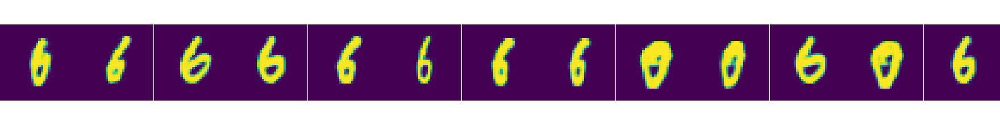

In [207]:
util.plot_imgs(lr.decode(cands[gold]));

In [183]:
agr[:, ident[-1]].shape

IndexError: index 58 is out of bounds for dimension 0 with size 20

In [166]:
util.plot_imgs(lr.decode(picks));

In [18]:
z = torch.randn(10, 5)

In [19]:
z.split(4)

(tensor([[-0.9190,  1.2969, -1.7898,  1.1759, -0.3530],
         [-0.6254, -0.0757,  0.7647,  0.3218, -0.8088],
         [ 0.8807, -1.4668, -0.4259,  1.3132, -0.5461],
         [-1.2100,  1.7509, -1.2874, -0.0602, -2.3012]]),
 tensor([[ 0.1092, -0.3305, -1.4475,  0.1787,  0.8206],
         [-1.0492,  1.3298, -0.3716, -1.6159, -1.0465],
         [ 1.4320,  0.1606,  0.4792,  0.7452, -1.3493],
         [ 0.5666, -0.6750, -1.5372,  0.3392, -0.3318]]),
 tensor([[ 0.3561,  0.6645, -0.8877, -0.7475, -0.6858],
         [ 0.5586,  0.4820,  1.4567, -1.2720, -1.0869]]))

In [10]:
num_dim=10
threshold=None

In [13]:
type(model)

conditional_eval.NVAE_Simple

In [17]:
Z, P = conditional_eval.NVAE_Wrapper.encode(model, X, prior=True, distr=True)
len(Z)

15

In [24]:
vrs

tensor([ 320.,  320.,  320.,  320.,  320., 1280., 1280., 1280., 1280., 1280., 1280., 1280., 1280., 1280., 1280.], device='cuda:0')

In [35]:
B = Z[0].mu.size(0)

vrs = torch.as_tensor([z.mu[0].numel() for z in Z]).to(Z[0].mu).long()
rungs = torch.cat([torch.ones(v.item())*i for i, v in enumerate(vrs)]).to(vrs)
inds = torch.cat([torch.arange(v) for v in vrs]).to(vrs)
informatives = torch.cat([z.sigma.div(p.sigma).view(B, -1) for z,p in zip(Z, P)], -1)
# informatives = informatives.min(0)[0]
informatives = informatives.mean(0)

In [36]:


if threshold is None:
    assert num_dim is not None
    picks = informatives.topk(num_dim, largest=False)[1]
    sel = torch.zeros_like(informatives)
    sel[picks] = 1.
    sel = sel.bool()
    picks = sel
else:
    picks = informatives.lt(threshold)

dim_spec = [inds[picks*(rungs==i)].tolist() for i in range(len(Z))]

In [37]:
dim_spec

[[57, 61, 63],
 [149],
 [261, 262, 265, 266, 270],
 [],
 [210],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

In [34]:
dim_spec

[[57, 61, 63],
 [149],
 [261, 262, 265, 266, 270],
 [],
 [210],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

<IPython.core.display.Javascript object>


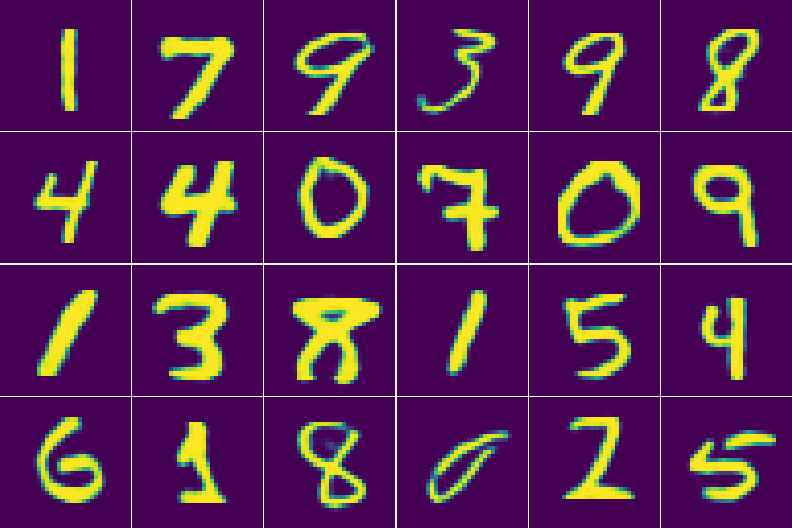

In [11]:
util.plot_imgs(model.decode(Z));

<IPython.core.display.Javascript object>


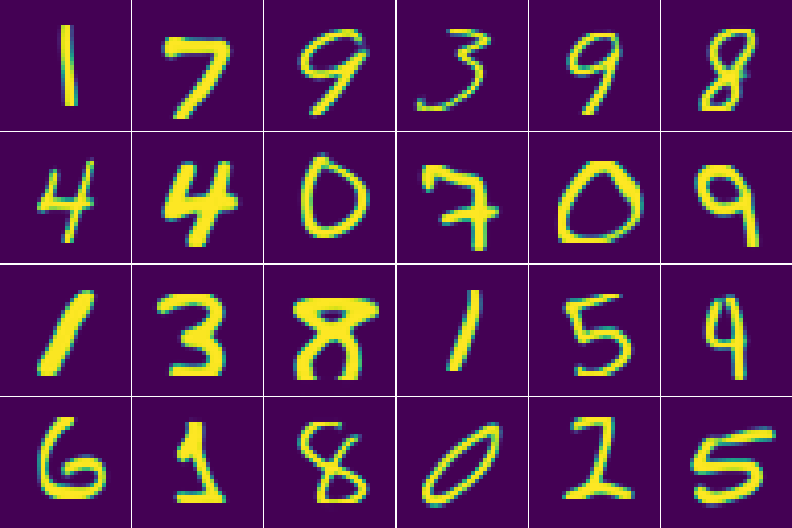

In [20]:
util.plot_imgs(model.decode([z.mu for z in Z]));

In [ ]:
zs, ps = encode(X, distr=False, prior=True, eps_table=None)
_hidden_zs = [z[0] for z in zs]
def gen_eps_table(N, t=1., gen=None):
    if not isinstance(N, int):
        N = N.shape[0]
#     if expand:
#         return [torch.randn(1, *z.shape, generator=gen).mul(t).expand(N, *z.shape).to(z) for z in _hidden_zs]
    return [torch.randn(N,*z.shape, generator=gen).mul(t).to(z) for z in _hidden_zs]
rec = decode(zs)
util.plot_imgs(rec);

In [343]:
root = Path('checkpoints')
ds_ckpts = list(root.glob('*'))
ds_ckpts

[PosixPath('checkpoints/celeba_64'),
 PosixPath('checkpoints/cifar10'),
 PosixPath('checkpoints/mnist'),
 PosixPath('checkpoints/celeba_64-20220119T083217Z-001.zip'),
 PosixPath('checkpoints/cifar10-20220119T083215Z-002.zip'),
 PosixPath('checkpoints/mnist-20220119T083212Z-001.zip')]

In [344]:
path = random.choice(ds_ckpts)
# path = root / 'mnist'
path = root / dname
if dname == 'cifar10':
    path = path / 'qualitative'
path

PosixPath('checkpoints/mnist')

In [345]:
ckpt = torch.load(path/'checkpoint.pt', map_location='cpu')

# checkpoint = torch.load(eval_args.checkpoint, map_location='cpu')
args = ckpt['args']
if not hasattr(args, 'ada_groups'):
    args.ada_groups = False
if not hasattr(args, 'min_groups_per_scale'):
    args.min_groups_per_scale = 1
if not hasattr(args, 'num_mixture_dec'):
    args.num_mixture_dec = 10
# if eval_args.batch_size > 0:
#     args.batch_size = eval_args.batch_size
arch_instance = utils.get_arch_cells(args.arch_instance)

In [346]:
model = AutoEncoder(args, None, arch_instance)
model.load_state_dict(ckpt['state_dict'], strict=False);
model = model.cuda();

len log norm: 183
len bn: 128


In [347]:
model.eval();

In [348]:
# model.train();

In [349]:
def set_bn(model, bn_eval_mode, num_samples=1, t=1.0, iter=100):
    if bn_eval_mode:
        model.eval()
    else:
        model.train()
        with autocast():
            for i in range(iter):
                if i % 10 == 0:
                    print('setting BN statistics iter %d out of %d' % (i+1, iter))
                model.sample(num_samples, t)
        model.eval()

In [350]:
temperature = 0.7
bn_eval_mode = True

In [351]:
# os.environ['OMNILEARN_DATA_DIR'] = '/is/ei/fleeb/workspace/local_data/'
os.environ['OMNILEARN_DATA_DIR']

'/is/ei/fleeb/workspace/local_data/'

In [352]:
# with torch.no_grad():
# #     set_bn(model, bn_eval_mode, num_samples=36, t=temperature, iter=500)
#     x = model.sample(24, temperature)
#     output = model.decoder_output(x)
#     output_img = output.mean if isinstance(output, torch.distributions.bernoulli.Bernoulli) \
#                         else output.sample()
# # output_img.shape
# util.plot_imgs(output_img);

In [353]:
_global_eps_table = None
def encode(x, t=1., prior=False, distr=True, eps_table=unspecified_argument, **kwargs):
    if eps_table is unspecified_argument:
        eps_table = _global_eps_table
    with torch.no_grad():
        x = x.cuda()
        return model.encode(x, t=t, distr=distr, prior=prior,eps_table=eps_table,  **kwargs)

def decode(all_q, t=1., eps_table=unspecified_argument, **kwargs):
    if eps_table is unspecified_argument:
        eps_table = _global_eps_table
    with torch.no_grad():
#         all_q = [q.cuda() for q in all_q]
        out = model.decode(all_q, t=t,eps_table=eps_table,  **kwargs)
        return to_img(out).cpu()

def to_img(logits):
    with torch.no_grad():
        img = model.decoder_output(logits)
        img = img.mean if isinstance(img, torch.distributions.bernoulli.Bernoulli) \
                            else img.sample()
    return img.cpu()

def enc(x):
    zs, ps = encode(x, distr=False, prior=True)
    return [z.sub(p.mu).div(p.sigma) for z, p in zip(zs, ps)]
    # return [out[0].mu] + [o.eps for o in out[1:]]
def dec(q):
    return decode([None], eps_table=q)


In [354]:
if dname == 'mnist':
    bsnum = 24
    dataset = fig.quick_run('load-data', name='mnist', batch_size=bsnum, seed=11)
elif dname == 'cifar10':
    bsnum = 24
    dataset = fig.quick_run('load-data', name='cifar10', batch_size=bsnum, seed=11)
elif dname == 'celeba_64':
    bsnum = 12
    dataset = fig.quick_run('load-data', name='celeba', batch_size=bsnum, seed=11, size=64, **{'_dataset_mod': 'interpolated'})
else:
    assert False
len(dataset)

| dataset: None (by default)
| CREATING . (type=dataset)
|  > num_workers: 0 (by default)
|  > batch_size: 24
|  > shuffle: True (by default)
|  > drop_last: False (by default)
|  > step_device --> device: 'cuda' (by default)
|  > infinite: False (by default)
|  > extractor: None (by default)
|  > allow_batched: True (by default)
|  > wrappers: [] (by default)
|  > mode-wrappers: {} (by default)
|  > split: {} (by default)
|  > shuffle-split: True (by default)
|  > split-src: 'train' (by default)
|  > default-mode --> mode: 'train' (by default)
|  > _dataset_type --> dataset-name --> name: 'mnist'
|  > _dataset_mod: [] (by default)
|  > mode-aliases: {} (by default)
|  > seed: 11
|  > device: 'cuda' (by default)
|  > pin_memory: False (by default)
|  > epoch_seed --> seed: 11
|  > skip_load: False (by default)
|  > CREATING . (type=dataset/mnist)
|  >  > dataroot: None (by default)
|  >  > mode: 'train'
|  >  > download: False (by default)
|  >  > train: True (by default)
|  >  > resiz

60000

In [355]:
batch = dataset.get_batch()
X, *other = batch
X.shape

torch.Size([24, 1, 32, 32])

In [356]:
# util.plot_imgs(X);

<IPython.core.display.Javascript object>


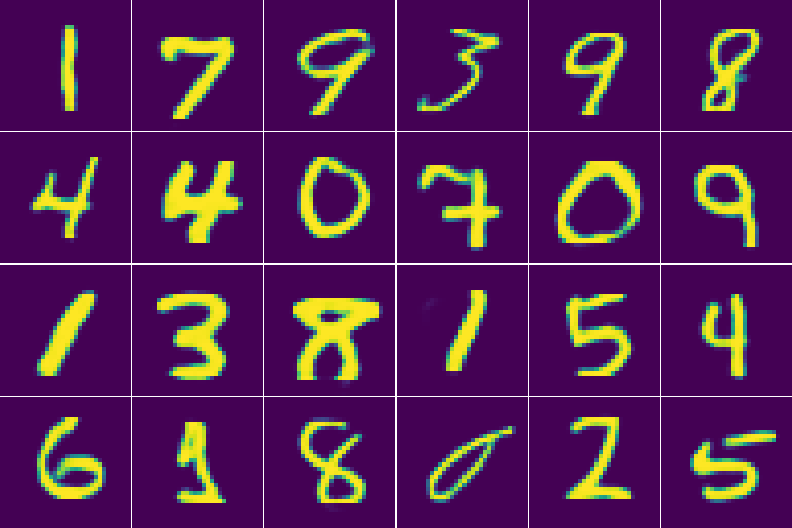

In [357]:
zs, ps = encode(X, distr=False, prior=True, eps_table=None)
_hidden_zs = [z[0] for z in zs]
def gen_eps_table(N, t=1., gen=None):
    if not isinstance(N, int):
        N = N.shape[0]
#     if expand:
#         return [torch.randn(1, *z.shape, generator=gen).mul(t).expand(N, *z.shape).to(z) for z in _hidden_zs]
    return [torch.randn(N,*z.shape, generator=gen).mul(t).to(z) for z in _hidden_zs]
rec = decode(zs)
util.plot_imgs(rec);

In [358]:
print([tuple(z[0].shape) for z in zs])

[(20, 4, 4), (20, 4, 4), (20, 4, 4), (20, 4, 4), (20, 4, 4), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8), (20, 8, 8)]


<IPython.core.display.Javascript object>


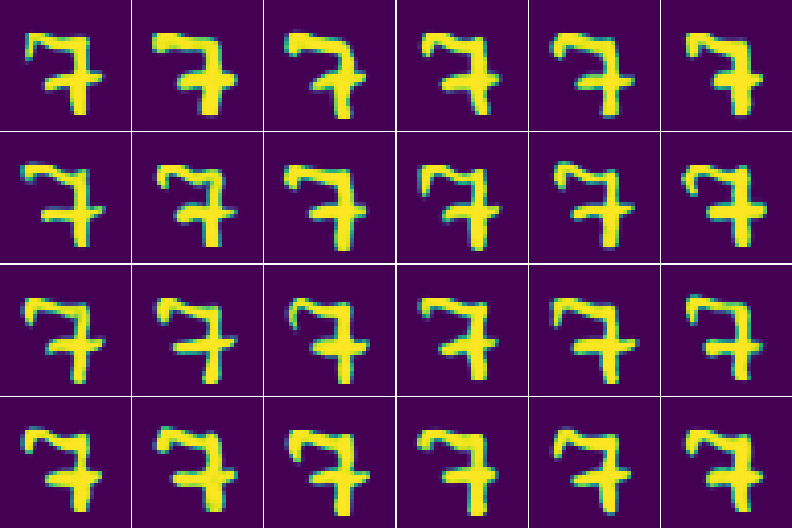

In [359]:
Xc = X[[torch.randint(len(X), size=()).item()]].expand(*X.shape)
util.plot_imgs(decode(encode(Xc, distr=True, eps_table=None), eps_table=None));

In [360]:
_global_eps_table = gen_eps_table(1, t=1, gen=torch.Generator().manual_seed(101))

In [21]:
# zis = zs.copy()
# zis = zis[:5]
# dis = decode(zis, t=0)
# util.plot_imgs(dis);

In [20]:
# util.plot_imgs(decode(encode(dis)));

In [21]:
# native reconstruction
# with torch.no_grad():
#     out = model(X)[0]
#     out = to_img(out)
# util.plot_imgs(out);

In [22]:
# native generate
# with torch.no_grad():
#     g = to_img(model.sample(12, t=.9))
#     g = g.cpu()
# util.plot_imgs(g);

In [361]:
# idx = np.random.randint(len(X))
x = X.clone()
# x = g.clone()
# x[:] = x[idx:idx+1]
# Zs, Ps = encode(x, t=0., prior=True)

In [27]:
# bnum = 8
# sel = np.arange(len(x))[-5:]
# bnum = len(sel)
# util.plot_imgs(util.combine_dims(seqs[:, sel].contiguous(), start=0, end=2), W=bnum);

In [28]:
# num = 5
# zs = [*Zs[:num], Ps[num].sample()[0]]
# util.plot_imgs(decode(zs,t=0.));

In [362]:
q = enc(X)
len(q)

15

In [363]:
r = dec(q)
r.shape

torch.Size([24, 1, 32, 32])

<IPython.core.display.Javascript object>


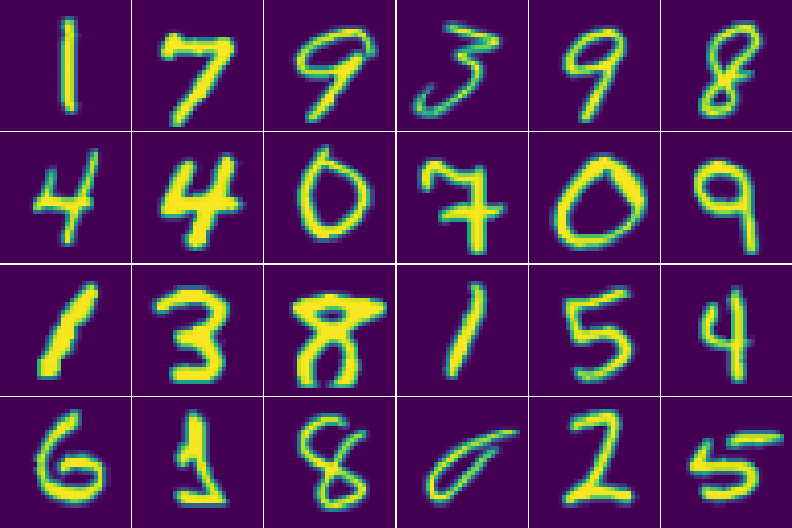

<IPython.core.display.Javascript object>


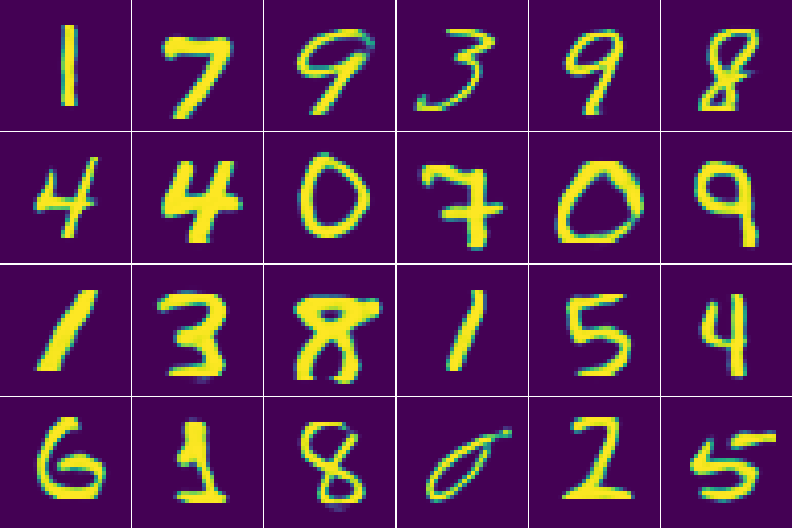

In [364]:
util.plot_imgs(X);
util.plot_imgs(r);

<IPython.core.display.Javascript object>


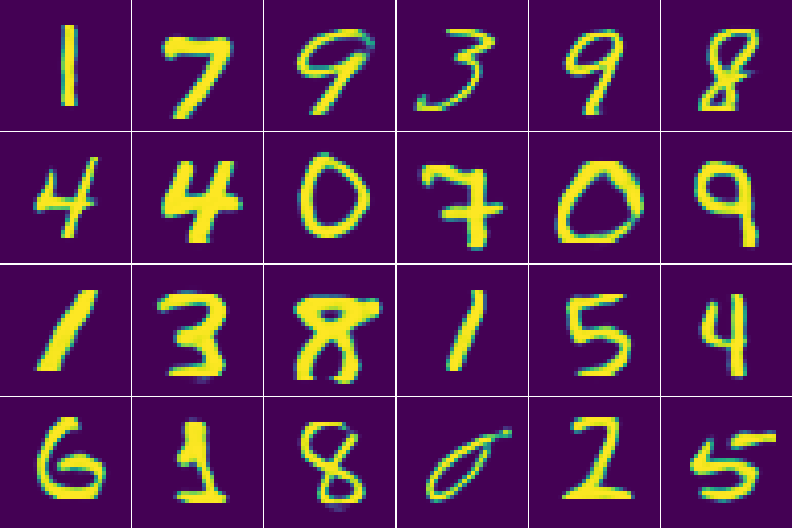

In [365]:
util.plot_imgs(dec(q));

<IPython.core.display.Javascript object>


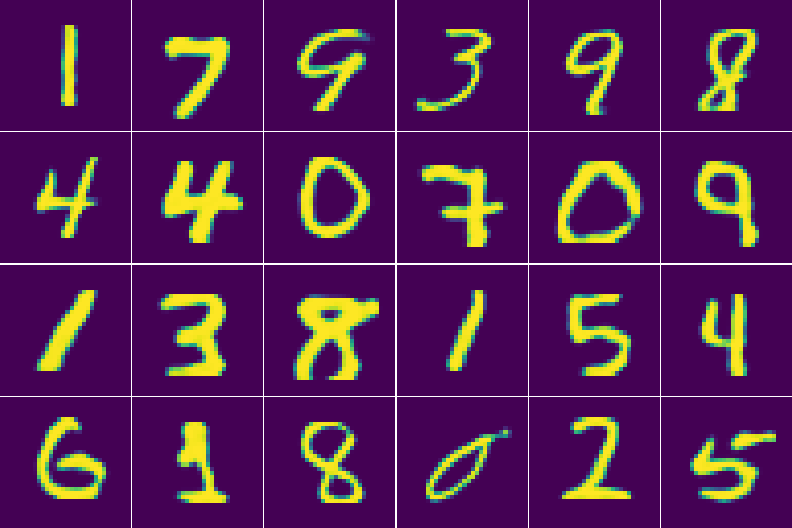

In [366]:
util.plot_imgs(dec(enc(r)));

<IPython.core.display.Javascript object>


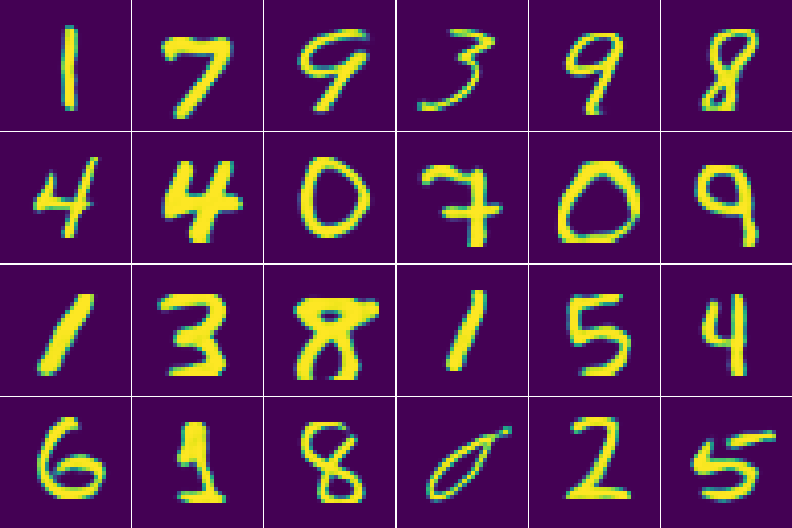

In [367]:

z2s = encode(rec)
rec2 = decode(z2s)
util.plot_imgs(rec2);

In [368]:
n_steps = 24
ends = gen_eps_table(2, t=1, gen=torch.Generator().manual_seed(101))
progress = torch.linspace(0,1.,n_steps).view(-1, 1,1,1).to(ends[0])
seq = [es[1:]*progress + es[:-1]*(1-progress) for es in ends]

<IPython.core.display.Javascript object>


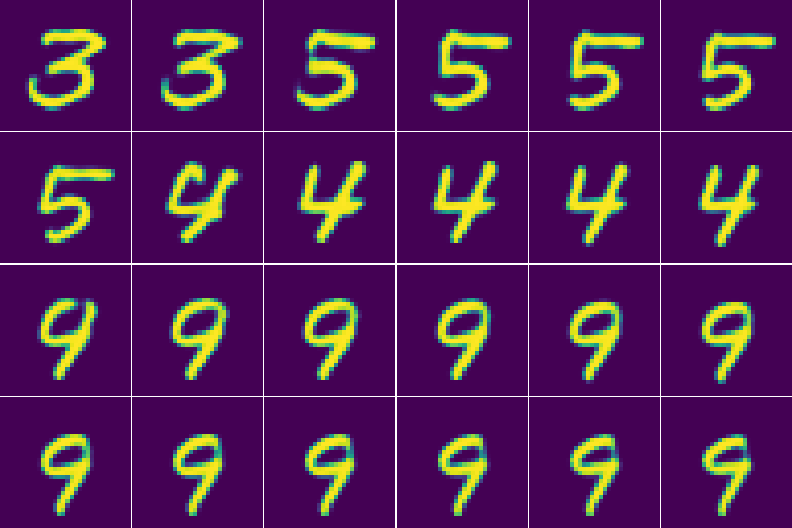

In [369]:
util.plot_imgs(dec(seq));

In [370]:
launch = X.clone()

/tmp/ipykernel_4142/639210667.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for _ in tqdm(range(10)):


  0%|          | 0/10 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


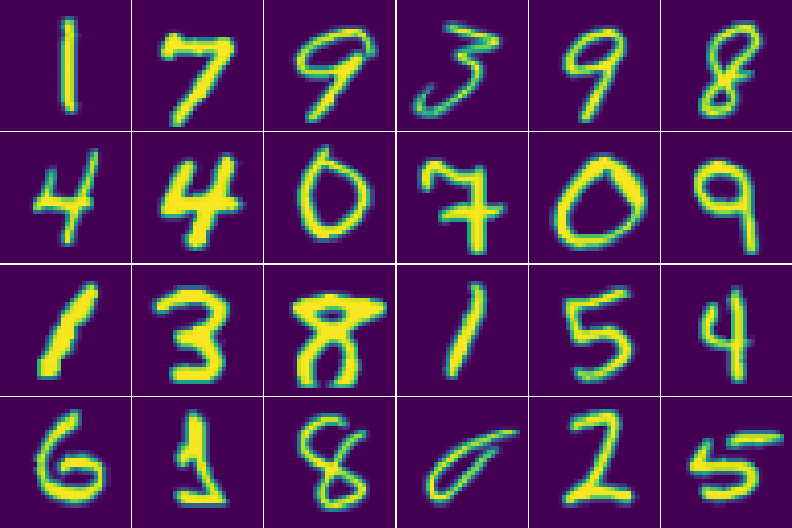

<IPython.core.display.Javascript object>


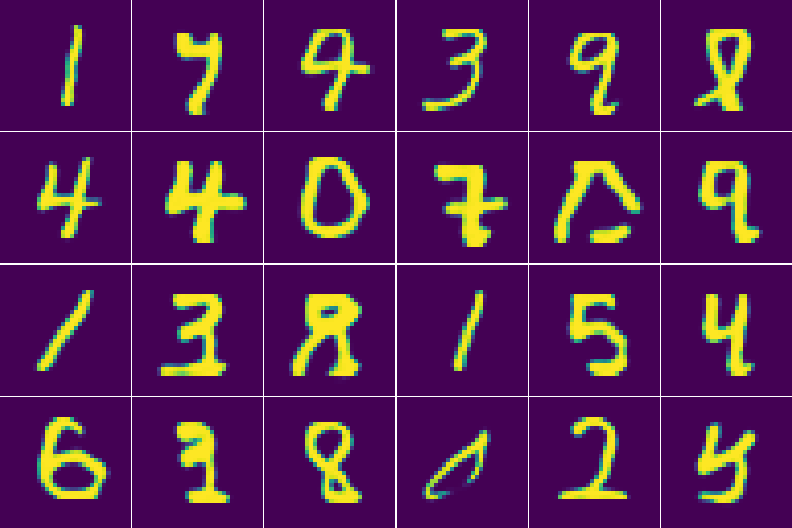

In [371]:
for _ in tqdm(range(10)):
    launch = dec(enc(launch))
util.plot_imgs(X);
util.plot_imgs(launch);

In [32]:
# Zc = enc(Xc)
# # z2s = encode(rec)
# # rec2 = decode(z2s)
# # util.plot_imgs(Xc);
# delta = [zc.add(torch.randn_like(zc).div(8)) for zc in Zc]
# util.plot_imgs(dec(delta));

In [62]:
N = 10
B = 20
K = len(Zc)
B, K

(20, 15)

In [61]:
zbase = gen_eps_table(N)
len(zbase)

15

In [54]:
zbase[0].shape

torch.Size([1, 20, 4, 4])

In [65]:
dZs, dZ2s = [], []
for i in tqdm(range(K)):
    zs = [z.unsqueeze(0).expand(B, *z.shape).contiguous().view(B*N, *z.shape[1:]) for j, z in enumerate(zbase)]
    izs = [(torch.randn_like(z) if i == j else z) for j, z in enumerate(zs)]
    
    z2s = enc(dec(zs))
    iz2s = enc(dec(izs))
    
    dzs = torch.stack([iz.sub(z).pow(2).view(B, N, -1).mean(-1) for iz, z in zip(izs, zs)], -1)
    dz2s = torch.stack([iz2.sub(z2).pow(2).view(B, N, -1).mean(-1) for iz2, z2 in zip(iz2s, z2s)], -1)
    
    dZs.append(dzs)
    dZ2s.append(dz2s)
dZs = torch.stack(dZs)
dZ2s = torch.stack(dZ2s)
dZs.shape, dZ2s.shape

<ipython-input-65-9c47b22f33bb>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(K)):


  0%|          | 0/15 [00:00<?, ?it/s]

(torch.Size([15, 20, 10, 15]), torch.Size([15, 20, 10, 15]))

<IPython.core.display.Javascript object>


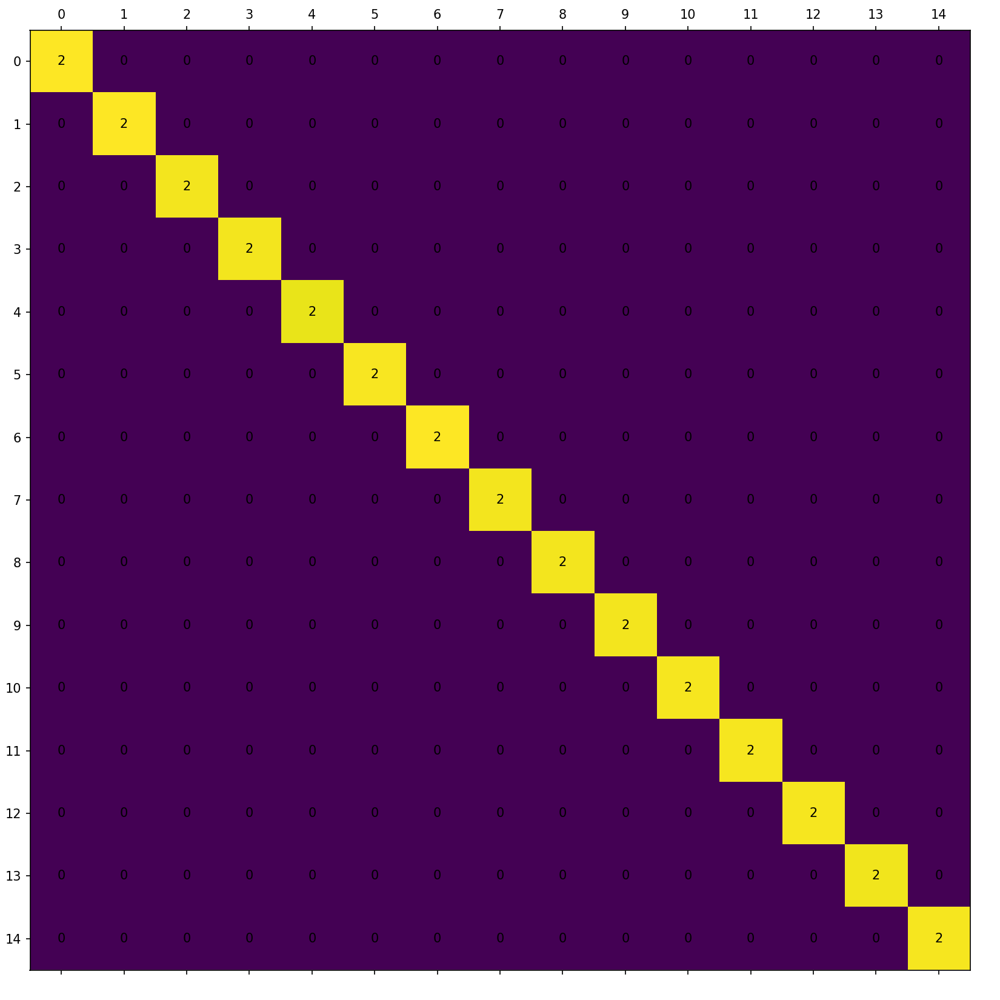

In [66]:
util.plot_mat(dZs.mean([1,2]), val_fmt=2);

<IPython.core.display.Javascript object>


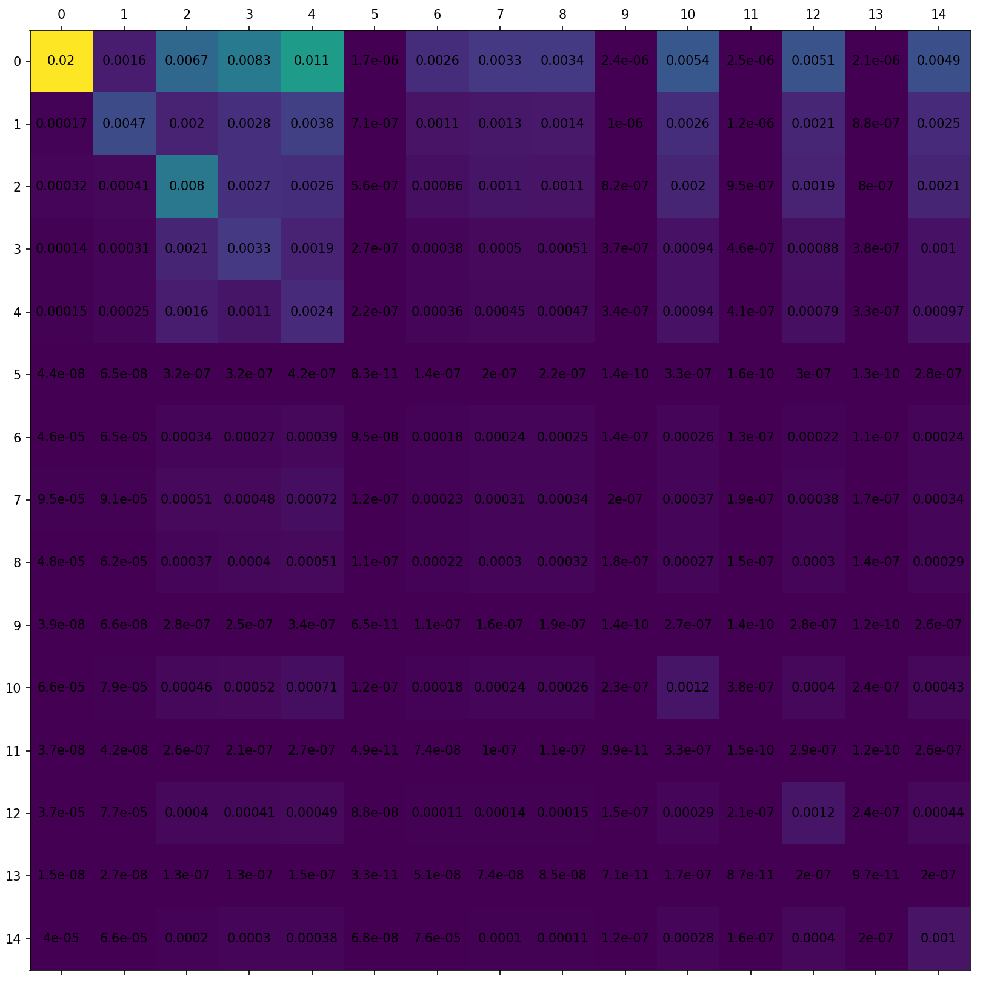

In [67]:
util.plot_mat(dZ2s.mean([1,2]), val_fmt=2);

In [372]:
d, p = encode(X, distr=True, prior=True)
d[0]

In [373]:
d[5].sigma.min()

tensor(0.2330, device='cuda:0')

In [374]:
d[4].sigma.min()

tensor(0.0748, device='cuda:0')

In [375]:
p[0].sigma.sub(d[0].sigma).mean(0).gt(.5).sum()

tensor(3, device='cuda:0')

In [376]:
idims = []
vi = 5
for vi in tqdm(range(len(p))):
#     informative = d[vi].sigma.sub(p[vi].sigma).div(p[vi].sigma).max(0)[0].lt(-.1)
    informative = d[vi].sigma.sub(p[vi].sigma).div(p[vi].sigma).mean(0).lt(-.1)
    dims = []
    # informative = (sigma < 0.8)
    for ind in np.ndindex(informative.shape):
        if informative[ind]:
            dims.append(ind)
    idims.append(dims)
len(idims), sum(map(len,idims))

/tmp/ipykernel_4142/2744519597.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for vi in tqdm(range(len(p))):


  0%|          | 0/15 [00:00<?, ?it/s]

(15, 73)

In [394]:
tbl = []
ths = torch.linspace(0.4, 0.99, 16)
dim_specs = []
for th in ths.tolist():
    informatives = [d[vi].sigma.div(p[vi].sigma).min(0)[0].lt(th) for vi in range(len(p))]
    informative = torch.stack([inf.sum() for inf in informatives])
#     informative = torch.stack([d[vi].sigma.div(p[vi].sigma).mean(0).lt(th).sum() for vi in range(len(p))])
    dim_spec = []
    for inf in informatives:
        dims = []
        for i, ind in enumerate(np.ndindex(inf.shape)):
            if inf[ind]:
                dims.append(i)
        dim_spec.append(dims)
    tbl.append(informative)
    dim_specs.append(dim_spec)

# dim_specs = [[tuple([slice(None),*list(zip(*ds))]) if len(ds) else None for ds in dim_spec] for dim_spec in dim_specs]
dim_specs = [[torch.as_tensor(ds).long().cuda() for ds in dim_spec] for dim_spec in dim_specs]
tbl = torch.stack(tbl)
tbl.shape

torch.Size([16, 15])

In [395]:
dim_specs[0]#[0]

[tensor([57, 61, 63], device='cuda:0'),
 tensor([149], device='cuda:0'),
 tensor([261, 262, 265, 266], device='cuda:0'),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64),
 tensor([], device='cuda:0', dtype=torch.int64)]

In [396]:
def dim_sel(t, ds):
    B = t.size(0)
    return t.view(B, -1).index_select(1,ds)
def dim_set(t, v, ds):
    B = t.size(0)
    v = torch.as_tensor(v).expand(*v.shape).to(t)
    t.view(B,-1).index_copy_(1,ds,v)

In [380]:
# dim_specs[3]

In [381]:
ths

tensor([0.4000, 0.4393, 0.4787, 0.5180, 0.5573, 0.5967, 0.6360, 0.6753, 0.7147, 0.7540, 0.7933, 0.8327, 0.8720, 0.9113, 0.9507, 0.9900])

In [382]:
tbl.sum(-1)

tensor([  8,   8,  10,  12,  17,  24,  31,  49,  70,  98, 122, 152, 184, 232, 284, 373], device='cuda:0')

In [383]:
tbl

tensor([[ 3,  1,  4,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 3,  1,  4,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 3,  1,  5,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 3,  1,  5,  0,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1],
        [ 3,  1,  5,  1,  5,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2],
        [ 3,  1,  5,  4,  6,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5],
        [ 3,  1,  5,  4,  7,  0,  0,  0,  0,  0,  2,  0,  4,  0,  5],
        [ 3,  2,  5,  4,  8,  0,  0,  0,  0,  0,  7,  0, 10,  0, 10],
        [ 3,  2,  5,  6,  8,  0,  0,  0,  0,  0, 13,  0, 16,  0, 17],
        [ 4,  2,  5,  8,  8,  0,  0,  0,  2,  0, 20,  0, 26,  0, 23],
        [ 5,  3,  5,  8,  9,  0,  0,  0,  6,  0, 27,  0, 29,  0, 30],
        [ 5,  3,  5, 10,  9,  0,  0,  7, 18,  0, 30,  0, 31,  0, 34],
        [ 5,  3,  5, 10,  9,  0,  1, 21, 25,  0, 36,  0, 34,  0, 35],
        [ 7,  3,  6, 11,  9,  0, 19, 29, 32,  0, 38,  0, 39,  0, 39],
        [10,  6, 10,

In [397]:
th_pick = 5
dim_spec = dim_specs[th_pick]
num_dim = tbl[th_pick].sum(-1).item()
ths[th_pick].item(), num_dim

(0.596666693687439, 24)

In [398]:
tbl[th_pick]#[0]

tensor([3, 1, 5, 4, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5], device='cuda:0')

In [399]:
def E(imgs, dims=None):
    if dims is None:
        dims = dim_spec
    zs = enc(imgs)
    return torch.cat([dim_sel(z, ds) for z, ds in zip(zs, dims)], -1).cpu()

def D(vals, dims=None):
    if dims is None:
        dims = dim_spec
    zs = [z.expand(len(vals),*z.shape[1:]).contiguous() for z in _global_eps_table]
    i = 0
    vals = vals.cuda()
    for z, dim in zip(zs, dims):
        dim_set(z, vals.narrow(1,i,len(dim)), dim)
        i += len(dim)
    return dec(zs)

def R(z):
    return E(D(z))

In [400]:
z = E(X)
z.shape

torch.Size([24, 24])

In [401]:
r = D(z)
r.shape

torch.Size([24, 1, 32, 32])

In [426]:
_global_eps_table = gen_eps_table(1, t=1)
_global_eps_table = [e*0 for e in _global_eps_table]

In [415]:
# util.plot_imgs(X);
# util.plot_imgs(r);
# # # util.plot_imgs(decs(encs(X)));

In [424]:
model2._global_prior_noise = model2.sample_prior()
model2._global_prior_noise = [n*0 for n in model2._global_prior_noise]

<IPython.core.display.Javascript object>


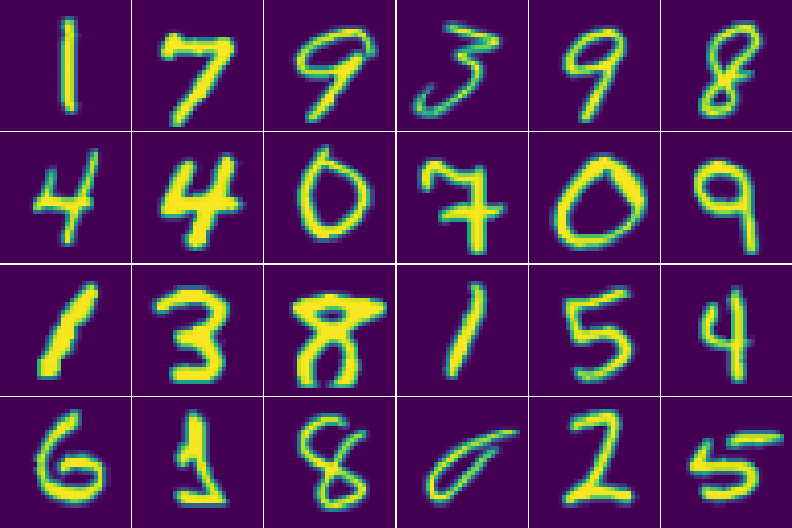

<IPython.core.display.Javascript object>


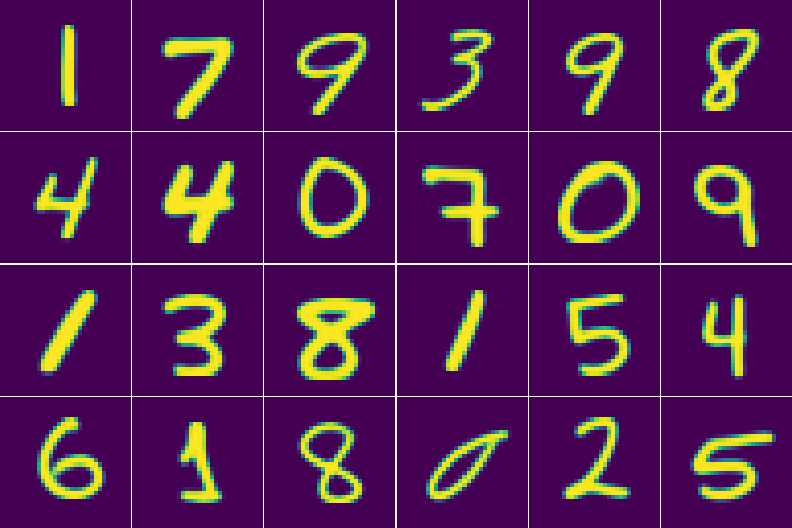

<IPython.core.display.Javascript object>


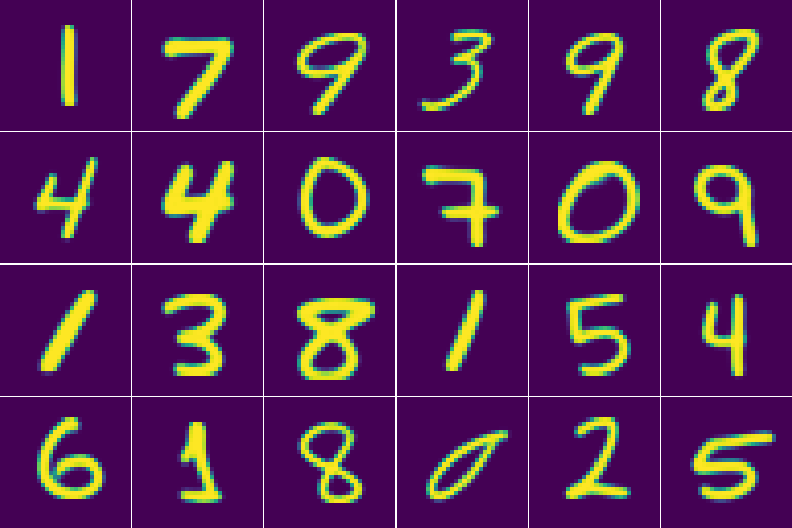

In [427]:
util.plot_imgs(X);
# util.plot_imgs(dec(enc(X)));
util.plot_imgs(D(E(X)));
util.plot_imgs(model2.decode(model2.encode(X)));

In [127]:
fullQ = []
total = 10000 if dname in {'mnist', 'cifar10'} else 256
bs = 1000 if dname in {'mnist', 'cifar10'} else 8
loader = dataset.get_loader(infinite=True, shuffle=True, seed=0, batch_size=bs)
loader = iter(loader)
pbar = tqdm(total=total)
while len(fullQ) < total//bs:
    x = next(loader)[0]
    fullQ.append(E(x))
    pbar.update(bs)
del loader
fullQ = torch.cat(fullQ)
dout = fullQ.size(-1)
fullQ.shape

/tmp/ipykernel_20966/243736467.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm(total=total)


  0%|          | 0/10000 [00:00<?, ?it/s]

torch.Size([10000, 24])

In [154]:
bsnum = 24
din = num_dim
prior = lambda B: torch.randn(B, num_dim)

In [136]:
lat = prior(bsnum)
lat.shape

torch.Size([24, 24])

In [147]:
# util.plot_imgs(D(lat));
# util.plot_imgs(D(E(D(lat))));

In [139]:
def interpolate(x,y,n=10):
    delta = torch.linspace(0,1,n).view(1,n,1).to(x.device)
    x = x.unsqueeze(1)
    y = y.unsqueeze(1)
    return delta*y + (1-delta)*x

In [140]:
sel = np.arange(len(lat))[:4]
nsteps = 10
trav = interpolate(lat[sel], lat[(sel+1)%len(lat)], nsteps)
trav.shape

torch.Size([4, 10, 24])

In [148]:
# util.plot_imgs(D(util.combine_dims(trav,0,2).contiguous()), W=nsteps);

In [142]:
niter = 8
qs = [lat]
rs = []

In [143]:
for _ in tqdm(range(niter)):
    rs.append(D(qs[-1]))
    qs.append(E(rs[-1]))
rs = torch.stack(rs)
qs = torch.stack(qs)
qs.shape, rs.shape

/tmp/ipykernel_20966/2183506975.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for _ in tqdm(range(niter)):


  0%|          | 0/8 [00:00<?, ?it/s]

(torch.Size([9, 24, 24]), torch.Size([8, 24, 1, 32, 32]))

In [132]:
def response_mat(Q, encode, decode, n_interv=None, scales=None,
                 force_different=False,
                 max_batch_size=None, device=None, pbar=None):
    if scales is not None:
        raise NotImplementedError

    @torch.no_grad()
    def response_function(q):
        if device is not None:
            q = q.to(device)
        r = encode(decode(q))
        if isinstance(r, distrib.Normal):
            r = r.loc
        return r

    B, D = Q.shape

    if n_interv is None:
        n_interv = B
    if max_batch_size is None:
        max_batch_size = n_interv

    itr = enumerate(Q.t())
    if pbar is not None:
        itr = pbar(itr, total=D)
        
    resps = []
    for i, qi in itr:  # Opy(D) (n_interv is parallelized)
        order = torch.randperm(B)
        iorder = order.clone()
        if force_different:
            iorder[1:] = order[:-1]
            iorder[0] = order[-1]
        qsel = slice(0,n_interv) if force_different else torch.randint(B, size=(n_interv,))
        isel = slice(0,n_interv) if force_different else torch.randint(B, size=(n_interv,))
        q = Q[order[qsel]]
        dq = q.clone()
        dq[:, i] = qi[iorder[isel]]
        z = util.process_in_batches(response_function, q, batch_size=max_batch_size)
        dz = util.process_in_batches(response_function, dq, batch_size=max_batch_size)
        resps.append(dz.sub(z).pow(2).mean(0).sqrt())
    return torch.stack(resps) / np.sqrt(2)

In [133]:
rmat = response_mat(fullQ, E, D, n_interv=50, max_batch_size=bs, pbar=tqdm)
rmat.shape

/tmp/ipykernel_20966/4090980778.py:25: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  itr = pbar(itr, total=D)


  0%|          | 0/24 [00:00<?, ?it/s]

torch.Size([24, 24])

<IPython.core.display.Javascript object>


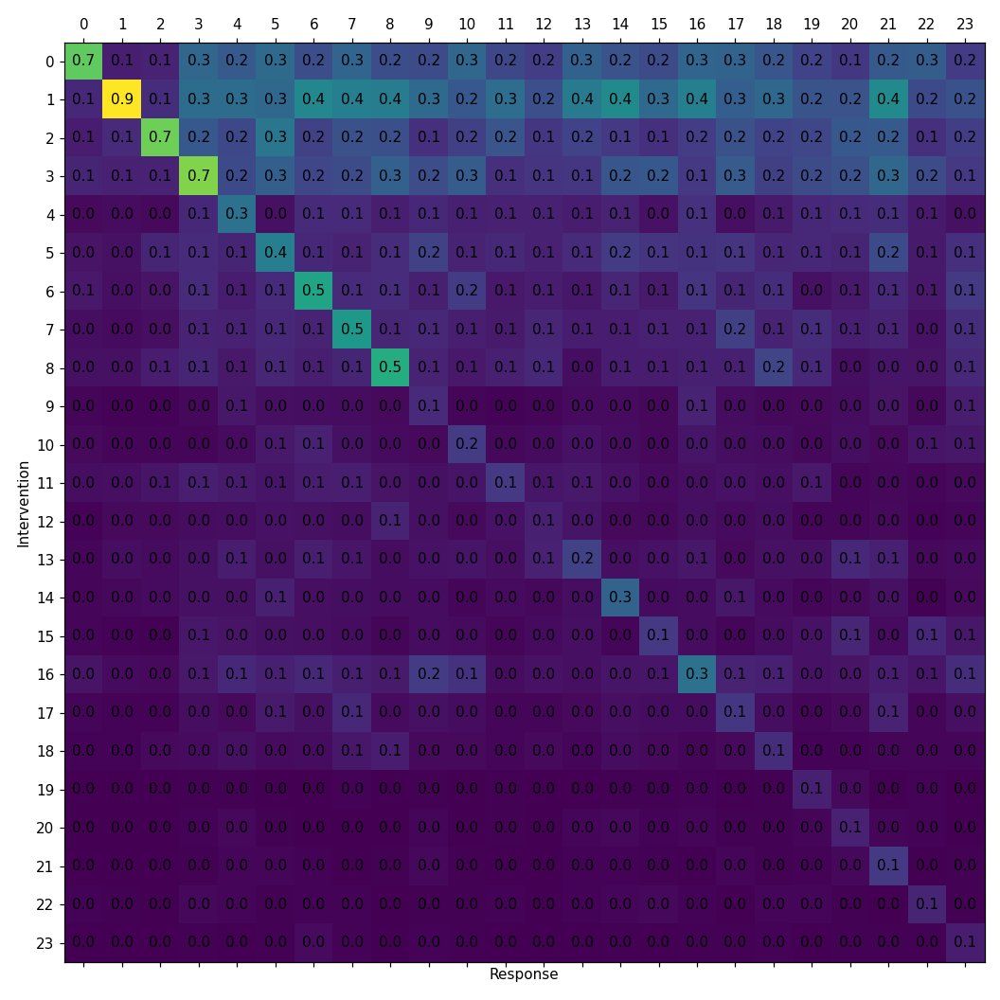

In [134]:
# threshold = 0.5
# threshold_2d = 0.1

sel = torch.arange(len(rmat))
# sel = torch.arange(len(rmat))[rmat.diag() > threshold]
# bsel = torch.arange(len(rmat))[rmat.diag() <= threshold]
# sel, bsel
# rsel = rmat.clone()
rsel = rmat[sel][:,sel]
hside = 0.4
util.plot_mat(rsel, val_fmt='.1f',
              figsize=(len(rsel)*hside, hside*len(rsel))
             ) # responses
plt.ylabel('Intervention')
plt.xlabel('Response')
plt.xticks(np.arange(len(sel)), map(str,sel.tolist()))
plt.yticks(np.arange(len(sel)), map(str,sel.tolist()))
plt.tight_layout();
# util.save_figure(f'{run_name}_sel_responses', root=figure_dir)
# util.save_figure(f'sel_responses', root=figure_dir)

In [149]:
# util.plot_imgs(rs[:,np.random.randint(rs.shape[1])], W=niter);

In [42]:
# util.plot_imgs(rs[0]);

In [43]:
# util.plot_imgs(rs[-1]);

In [145]:
Q = lat.clone()
Q.shape

torch.Size([24, 24])

In [150]:
dims = 0,1
# dims = 1,2
# dims = 0,2
# dims = 43, 44
# dims = 35, 37
# dims = 45, 53
# dims = 36, 52
# dims = 29, 53
# dims = 137, 135
dims = 1, 16

ix, iy = dims
dims

(1, 16)

In [169]:
# stretch = .1

# dims3d = (0,1,2)
# # dims3d = (*dims, 29)

# pts = torch.randn(*fullQ.shape)
# # pts = fullQ.clone()
# pts_steps = [pts]


# original_pts = pts.clone()

# mn, mx = pts.min(0)[0], pts.max(0)[0]
# rg = mx-mn
# mn, mx = mn-stretch*rg, mx+stretch*rg

# def _plt_pts(pts, cs='C0', fsize=6, **kwargs):
#     fg = plt.figure(figsize=(fsize,fsize))
#     ax = fg.add_subplot(111, projection='3d');

#     ax.scatter(*pts[:,dims3d].t().numpy(), marker='.', alpha=0.3, c=cs, **kwargs)
#     ax.set_xlabel(f'Dimension {dims3d[0]}')
#     ax.set_ylabel(f'Dimension {dims3d[1]}')
#     ax.set_zlabel(f'Dimension {dims3d[2]}');

# # plt.figure(figsize=(8,8))
# # plt.title('Posterior')
# # plt.xlabel(f'Dimension {ix}')
# # plt.ylabel(f'Dimension {iy}')
# # # plt.xlim(mn[0], mx[0])
# # # plt.ylim(mn[1], mx[1])
# # hist, *other = np.histogram2d(*pts.t().cpu().numpy(), bins=nside, normed=True, range=torch.stack([mn[list(dims)], mx[list(dims)]]).t().cpu().numpy())
# # plt.imshow(hist.T[::-1], cmap='Blues', interpolation='spline36',
# #            extent=[mn[0].item(), mx[0].item(),mn[1].item(), mx[1].item()], aspect=aspect_ratio);

# # _plt_pts(pts)

In [60]:
for i in range(8):
    newpts = []
    for v, in tqdm(DataLoader(TensorDataset(pts), batch_size=bs), desc=f'Cycling {len(pts)} samples'):
        with torch.no_grad():
            newpts.append(R(v))
    pts = torch.cat(newpts)
    pts_steps.append(pts)
# del newpts
PTS = torch.stack(pts_steps)
PTS.shape

/tmp/ipykernel_7185/311462356.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for v, in tqdm(DataLoader(TensorDataset(pts), batch_size=bs), desc=f'Cycling {len(pts)} samples'):


Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

Cycling 10000 samples:   0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([9, 10000, 3])

In [95]:
# _plt_pts(pts,fsize=12);
# plt.title(f'Step {len(pts_steps)-1}');

In [62]:
k = 8
pts = PTS[k]

In [63]:
from sklearn import cluster
# cmdl = cluster.AgglomerativeClustering(
#     n_clusters=None, 
#     distance_threshold=0.1, 
#     linkage='single')
# cmdl = cluster.Birch(threshold=0.8, branching_factor=20, n_clusters=None)
# cmdl = cluster.KMeans(n_clusters=20, random_state=0)
# cmdl = cluster.DBSCAN(eps=0.1, min_samples=10)
cmdl = cluster.DBSCAN(eps=0.12, min_samples=4)
# cmdl = cluster.OPTICS(
# #     min_samples=10, 
#     min_samples=50, 
# #     min_cluster_size=0.02, 
# #     metric='l2', 
# #     cluster_method='dbscan', 
#     max_eps=5,
# #     xi=0.01,
# )
clts = torch.from_numpy(cmdl.fit(pts.numpy()).labels_)
clts.max()+1, (clts>0).sum()/len(clts)*100

(tensor(52), tensor(86.3800))

In [152]:

# _plt_pts(pts, cs=[distinct_colors[(c%(len(distinct_colors)-1))+1] if c > 0 else 'w' for c in clts], fsize=12);
# # _plt_pts(pts[torch.from_numpy(clts)>0], cs=[distinct_colors[c+1] if c > 0 else 'w' for c in clts if c > 0], fsize=12);
# plt.title(f'Step {k}');
# # plt.savefig(str(imgroot/f'clusters-step{k}.png'));

In [97]:
_plt_pts(pts,fsize=12);
plt.title(f'Step {len(pts_steps)-1}');
plt.title(f'Step {k}');
# plt.savefig(str(imgroot/f'pts-step{k}.png'));

In [136]:
# _plt_pts(original_pts, cs=[distinct_colors[(c%(len(distinct_colors)-1))+1] if c > 0 else 'w' for c in clts], fsize=12);

In [86]:
cnts = torch.bincount(clts[clts>0])
order = cnts.sort(0,descending=True)[1]

In [87]:
nums = cnts[order].float()
nums[1:-1].div(nums[:-2]).min(0)
cnts[order][:50]

tensor([1645, 1009,  869,  770,  708,  537,  487,  357,  339,  335,  293,  269,  226,  143,  130,   69,   61,   61,   51,   28,   27,   24,   16,   15,   14,   10,   10,    9,    9,    9,    8,    7,    7,    7,    7,    7,    6,    5,    5,    5,    5,    5,    4,    4,    4,    4,    4,    4,
           4,    3])

In [102]:
# qsel = original_pts[clts == order[1]]
# util.plot_imgs(D(qsel[torch.randperm(qsel.size(0))[:20]]));

In [98]:
# topk = 20
# egs = 8
# imgs = []
# for o in order[:topk]:
#     qsel = pts[clts == o]
# #     qsel = original_pts[clts == o]
#     imgs.append(D(qsel[torch.randperm(qsel.size(0))[:egs]]))
# print(cnts[order[:topk]]/len(pts)*100)
# fg, axs = util.plot_imgs(torch.cat(imgs), H=topk, W=egs);
# len(axs)

In [137]:
# plt.savefig(str(imgroot/f'cluster-samples.png'));

In [132]:
axs = np.array(axs).reshape(topk,egs)
axs.shape

(20, 8)

In [133]:
for axrow, p in zip(axs, (cnts[order[:topk]]/len(pts)*100).tolist()):
    for a in axrow:
        plt.sca(a)
        plt.axis('on')
        plt.xticks([],[])
        plt.yticks([],[])
    plt.sca(axrow[0])
    plt.ylabel(f'{p:2.1f}%')

In [134]:
plt.subplots_adjust(left=0.05);
# plt.subplots_adjust(wspace=between, hspace=between, left=border, right=1 - border, bottom=border, top=1 - border)

In [135]:
(cnts[order[:topk]]/len(pts)*100).sum()

tensor(85.6400)

In [65]:
PTS.shape

torch.Size([9, 10000, 3])

In [66]:
motion = PTS[1:] - PTS[:-1]

In [74]:
motion.shape

torch.Size([8, 10000, 3])

In [73]:
# 10000000 ** (1/64)

In [75]:
motion.norm(2, -1).mean(-1)

tensor([0.1835, 0.1272, 0.1008, 0.0848, 0.0740, 0.0659, 0.0599, 0.0544])

In [78]:
motion.mean(1).norm(2,-1)

tensor([0.0742, 0.0602, 0.0488, 0.0407, 0.0342, 0.0293, 0.0258, 0.0231])

In [115]:
# from sklearn import manifold
# import umap

In [204]:
# # embedding = manifold.Isomap(n_neighbors=10, n_components=2)
# # embedding = manifold.TSNE(n_components=2)
# embedding = umap.UMAP(n_neighbors=20)
# psel = pts[clts == order[1]]
# psel = pts
# pts_t = torch.as_tensor(embedding.fit_transform(psel.numpy()))

In [202]:
# cl = psel[:,1]
# cl = (cl-cl.min()) / (cl.max()-cl.min())
# cl.min(), cl.max()
# _plt_pts(psel,cl.numpy().tolist(), cmap='viridis',fsize=6);

In [203]:
# plt.figure()
# plt.scatter(*pts_t.t().numpy(), c=cl.numpy().tolist(), cmap='viridis');

In [195]:
# xpts = torch.randn(50, 2)*3 + torch.as_tensor([2.,6])
# xpts = torch.linspace(0,1,50).float().view(-1, 1)
# xs, xe = torch.as_tensor([11.5, 5.4]), torch.as_tensor([-5.3, 7])
# xpts = (1-xpts)*xs.view(1,-1) + xpts*xe.view(1,-1)

In [196]:
plt.figure(24)
# plt.scatter(*xpts.t().numpy(), marker='x');

plt.plot(*xpts.t().numpy());

In [197]:
vpts = torch.as_tensor(embedding.inverse_transform(xpts.numpy()))
vpts.shape

torch.Size([50, 3])

In [198]:
plt.figure(23)
# plt.gca().scatter(*vpts.t().numpy(), marker='x');
plt.gca().plot(*vpts.t().numpy());

<Axes3DSubplot:xlabel='Dimension 0', ylabel='Dimension 1'>

In [138]:
# Qsel = Q[:,dims]
# pt = Qsel.sub(Qsel.mean(0,keepdim=True))
# # plt.figure()
# # plt.scatter(*pts.t(), marker='.', c='k');
# U, S, V = torch.svd(pt.t() @ pt / (len(pt) - 1))
# S = S.sqrt()
# print('S',S)
# print(U)
# Q.shape, Qsel.shape

In [160]:
rg = 5

# mn, mx = Q.min(0)[0].unsqueeze(-1)-stretch*rg, Q.max(0)[0].unsqueeze(-1)+stretch*rg
# mn, mx = mn.view(-1), mx.view(-1)

# print(mn[list(dims)], mx[list(dims)])

mn, mx = torch.ones(din)*-rg, torch.ones(din)*rg

In [161]:
bidx = 9
bidx = 0
# qbase = Q[bidx]

other_dims = [i for i in range(din) if i not in dims]

qbase = torch.randn(din)

z0 = 0.
# qbase[other_dims] = z0

qbase

tensor([-0.9969, -1.7420,  0.0194,  0.4991, -0.4990, -0.8420,  0.7885,  0.6921,  1.0283, -0.0425, -0.7173, -1.1755,  1.1840,  2.0797, -0.2822,  1.3156, -0.9081,  0.8545, -0.5919, -0.2363,  0.2274, -1.0570, -1.1557, -0.1880])

In [162]:
n = 32
nside = n
h, w = n, n

xvals, yvals = torch.linspace(mn[ix].item(),mx[ix].item(),h), torch.linspace(mn[iy].item(),mx[iy].item(),w)
# xvals, yvals = torch.linspace(-rg,rg,h), torch.linspace(-rg,rg,w)
cx, cy = torch.meshgrid(xvals, yvals)
cx = cx.reshape(-1)
cy = cy.reshape(-1)

vecs = qbase.unsqueeze(0).expand(len(cx), -1).contiguous()
vecs[:, ix] = cx
vecs[:, iy] = cy
vecs.shape

torch.Size([1024, 24])

In [163]:
starts = vecs[...,dims]
ends = []
for v, in tqdm(DataLoader(TensorDataset(vecs), batch_size=bs), desc=f'Cycling {len(vecs)} samples'):
    with torch.no_grad():
        ends.append(R(v)[...,dims])
starts = starts.view(h,w,2)
ends = torch.cat(ends).view(h,w,2)
dels = ends.sub(starts)
delmap = dels.permute(1,0,2).numpy()[::-1]
ends.shape

/tmp/ipykernel_20966/2200089322.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for v, in tqdm(DataLoader(TensorDataset(vecs), batch_size=bs), desc=f'Cycling {len(vecs)} samples'):


Cycling 1024 samples:   0%|          | 0/2 [00:00<?, ?it/s]

torch.Size([32, 32, 2])

In [164]:
# # dmap = torch.cdist(starts, Qsel).min(-1)[0].view(n,n)
# dmap = torch.cdist(starts, cts).min(-1)[0].view(n,n)
# # dmap = torch.cdist(starts, Qsel).mean(-1).view(n,n)
# distmap = dmap.numpy()
# dmap = dmap.t().numpy()[::-1]

mags = dels.pow(2).sum(-1)
costmap = mags.numpy()
mags = mags.t().numpy()[::-1]
# mags = deltas.view(h,w,2)[...,0]

normdels = dels.div(dels.norm(dim=-1,keepdim=True))
def get_divergence(deltas):
    divx, divy = np.gradient(deltas, axis=[0,1])
    divM = divx[...,0] + divy[...,1]
    return torch.from_numpy(divM)
divM = get_divergence(dels)
ndivM = get_divergence(normdels)

happymap = divM<0
happy = happymap.t().numpy()[::-1]
# landscape = divM - divM.min()
# divM -= divM.min()
divergence = divM
divM = divM.t().numpy()[::-1]
posterior_logits = ndivM.mul(-1)
ndivM = posterior_logits.t().numpy()[::-1]

divMprop = torch.from_numpy(divM.copy()).clone()
divMprop[divMprop>0] /= divMprop[divMprop>0].max().abs()
divMprop[divMprop<0] /= divMprop[divMprop<0].min().abs()
divMprop = divMprop.numpy()

ndivMprop = torch.from_numpy(ndivM.copy()).clone()
ndivMprop[divMprop>0] /= ndivMprop[divMprop>0].max().abs()
ndivMprop[divMprop<0] /= ndivMprop[divMprop<0].min().abs()
ndivMprop = ndivMprop.numpy()


# fmag = mags + dmap
# spacemap = distmap + costmap

fmag = mags
spacemap = costmap

In [165]:
def cdf(x):
    return x.div(np.sqrt(2)).erf().add(1).div(2)
dx = xvals[1]-xvals[0]
xedges = torch.linspace(xvals[0]-dx/2,xvals[-1]+dx/2,w+1)
dy = yvals[1]-yvals[0]
yedges = torch.linspace(yvals[0]-dy/2,yvals[-1]+dy/2,h+1)
xcdf = cdf(xedges)
xprob = xcdf[1:] - xcdf[:-1]
ycdf = cdf(yedges)
yprob = ycdf[1:] - ycdf[:-1]
xyprob = torch.stack(torch.meshgrid(xprob, yprob)).prod(0)
xyprob.sum(), xyprob[~happymap].sum(), xyprob[~happymap].sum().div(xyprob.sum())

(tensor(1.0000), tensor(0.0636), tensor(0.0636))

In [166]:
n = 10
h, w = n, n

xvals, yvals = torch.linspace(mn[ix].item(),mx[ix].item(),h), torch.linspace(mn[iy].item(),mx[iy].item(),w)
# xvals, yvals = torch.linspace(-rg,rg,h), torch.linspace(-rg,rg,w)
cx, cy = torch.meshgrid(xvals, yvals)
cx = cx.reshape(-1)
cy = cy.reshape(-1)

vecs = qbase.unsqueeze(0).expand(len(cx), -1).contiguous()
vecs[:, ix] = cx
vecs[:, iy] = cy

emb = []
for v, in tqdm(DataLoader(TensorDataset(vecs), batch_size=bs), desc=f'Decoding {len(vecs)} samples'):
    with torch.no_grad():
        emb.append(D(v))
emb = torch.cat(emb)
C, H, W = emb.shape[-3:]
emb = util.split_dim(emb, h,w)
emb = torch.from_numpy(emb.numpy()[:,::-1].copy()).contiguous()
emb = emb.permute(2,1,3,0,4).reshape(C, h*H, w*W)
# imshape = imgs.shape[-3:]
# imgs = torch.from_numpy(util.split_dim(imgs, h,w).numpy()[:,::-1].copy()).contiguous().permute(1,0,2,3,4).contiguous()
# imgs = util.combine_dims(imgs, 0,2)
emb.shape

/tmp/ipykernel_20966/2633775350.py:15: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for v, in tqdm(DataLoader(TensorDataset(vecs), batch_size=bs), desc=f'Decoding {len(vecs)} samples'):


Decoding 100 samples:   0%|          | 0/1 [00:00<?, ?it/s]

torch.Size([1, 320, 320])

In [167]:
threshold = 0.1

pts = fullQ.clone()#[:,dims]

ext = pts[:,other_dims]
valid = (threshold >= ext).mul(-threshold<=ext).prod(-1)
valid[:] = 1
pts = pts[valid.bool()]
pts = pts[:,dims]
len(pts) / len(valid)

1.0

<IPython.core.display.Javascript object>


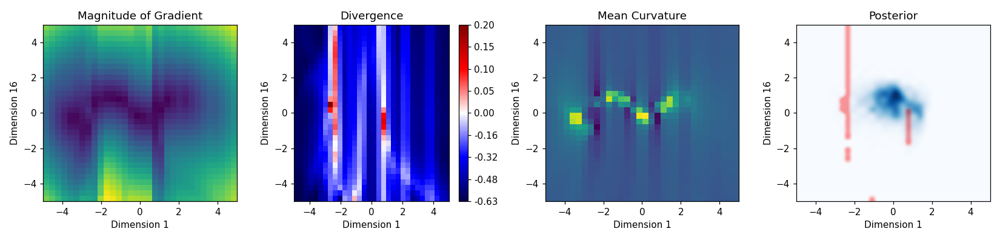

<IPython.core.display.Javascript object>


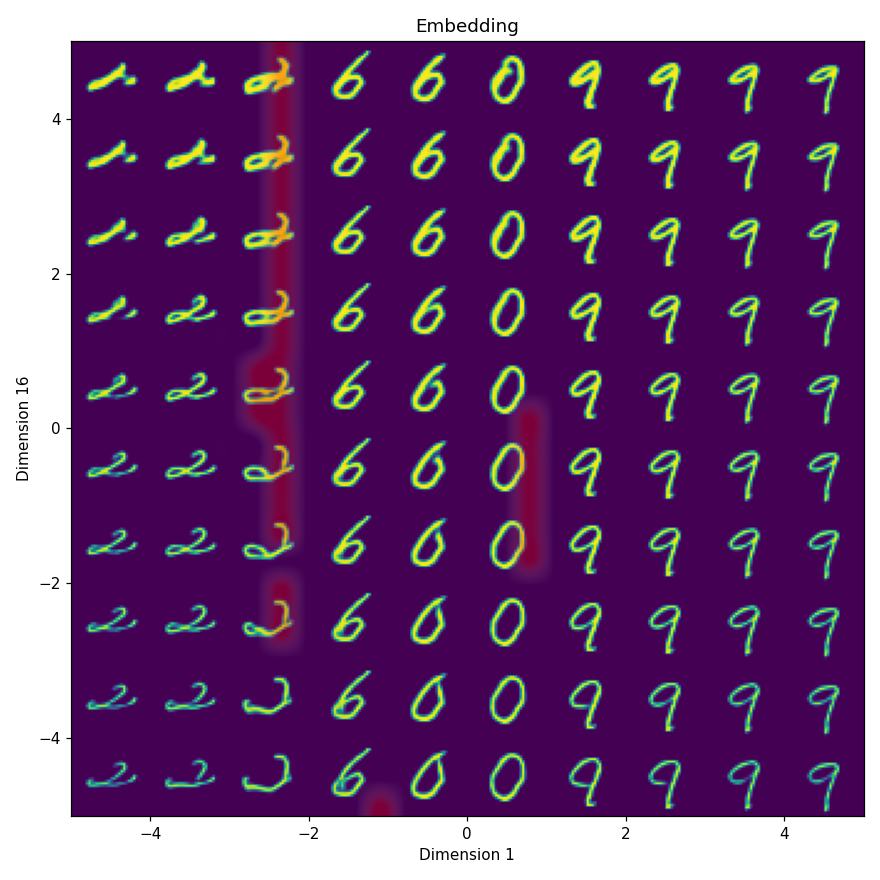

In [168]:
im = fmag
im = divM
# im = happy

# plt.figure()
# # plt.title('Map')
# plt.xlabel(f'Dimension {ix}')
# plt.ylabel(f'Dimension {iy}')
# plt.imshow(im, extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()]);
# plt.tight_layout()

aspect_ratio = 'auto'
# aspect_ratio = 1

fg, axs = plt.subplots(1,4, figsize=(15,3.6))

plt.sca(axs[0])
plt.title('Magnitude of Gradient')
plt.xlabel(f'Dimension {ix}')
plt.ylabel(f'Dimension {iy}')
plt.imshow(mags**0.5, extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio);
# plt.imshow(ndivM);


plt.sca(axs[1])
# plt.title('Distance Mags')
# plt.imshow(dmap, extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()]);
plt.title('Divergence')
plt.imshow(divMprop, cmap='seismic', extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio);
cbar = plt.colorbar()
axvals = np.concatenate([np.linspace(divM.min(), 0,5), np.linspace(0,divM.max(),5)[1:]])
axlbls = [f'{v.item():.2f}' for v in axvals]
cbar.set_ticks(np.linspace(-1, 1,9))
cbar.set_ticklabels(axlbls)
# cbar.set_ticks(np.linspace(-1, 1,9), np.linspace(divM.min(), divM.max(),9))
# plt.imshow(divM);
plt.xlabel(f'Dimension {ix}')
plt.ylabel(f'Dimension {iy}')

plt.sca(axs[2])
plt.title('Mean Curvature')
plt.xlabel(f'Dimension {ix}')
plt.ylabel(f'Dimension {iy}')
plt.imshow(ndivMprop, extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio);
# plt.imshow(ndivM);


plt.sca(axs[3])
plt.title('Posterior')
plt.xlabel(f'Dimension {ix}')
plt.ylabel(f'Dimension {iy}')
plt.xlim(xvals.min(),xvals.max(),)
plt.ylim(yvals.min(),yvals.max())
hist, *other = np.histogram2d(*pts.t().cpu().numpy(), bins=nside, normed=True, range=torch.stack([mn[list(dims)], mx[list(dims)]]).t().cpu().numpy())
plt.imshow(hist.T[::-1], cmap='Blues',interpolation='spline36',
           extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio)
# plt.imshow(mags, extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio);
badsel = np.ones((*happy.shape,4))
badsel[...,-1] = 0.
badsel[~happy] = [1,0,0,1]
plt.imshow(badsel, #np.stack([happy, np.ones_like(happy), np.ones_like(happy), ], -1)*255,
#            cmap='Reds', alpha=0.8,
           alpha=0.4,interpolation='spline36',
           extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio)
# plt.imshow(mags);
plt.tight_layout();

plt.figure(figsize=(8,8))
plt.imshow(emb.permute(1,2,0),  extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio);
plt.imshow(badsel, #np.stack([happy, np.ones_like(happy), np.ones_like(happy), ], -1)*255,
#            cmap='Reds', alpha=0.8,
           alpha=0.3,interpolation='spline36',
           extent=[xvals.min(),xvals.max(),yvals.min(),yvals.max()], aspect=aspect_ratio)

plt.title('Embedding')
plt.xlabel(f'Dimension {ix}')
plt.ylabel(f'Dimension {iy}')
plt.tight_layout();

In [85]:
# plt.figure(13)

In [168]:
# plt.savefig(str(imgroot/f'{dname}-{dims[0]}-{dims[1]}.png'));

In [204]:
from sklearn import mixture

In [447]:
N_base = 4

In [448]:
lbl_idx = 1

imgs = dataset.get_data().images

lbl_sel = dataset.get_data().targets == lbl_idx
lbl_sel = torch.arange(len(lbl_sel))[lbl_sel]
len(lbl_sel)

6742

In [449]:
Xa = imgs[lbl_sel[:N_base]].float().div(255).cpu()
Xa.shape

torch.Size([4, 1, 32, 32])

In [450]:
za = E(Xa)
za.shape

torch.Size([4, 24])

<IPython.core.display.Javascript object>


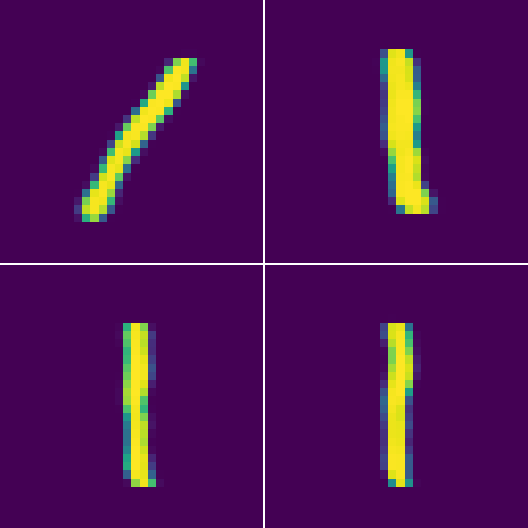

In [451]:
util.plot_imgs(D(za));

In [346]:
# z = za + torch.randn_like(za) * 0.4
# # z /= z.std(0,keepdim=True)
# util.plot_imgs(D(z));

<IPython.core.display.Javascript object>


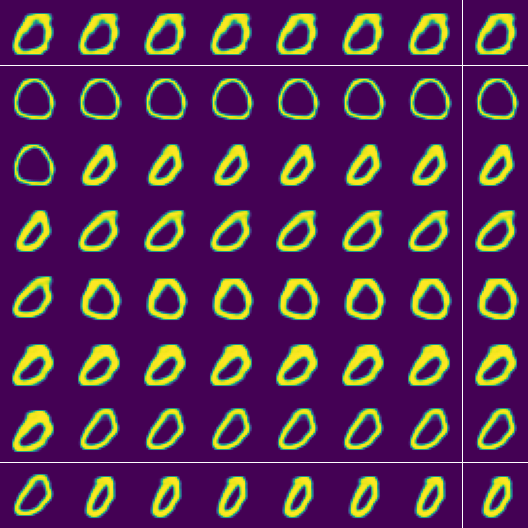

In [347]:
mm = mixture.GaussianMixture(n_components=8, covariance_type='full', random_state=0)
mm.fit(za.numpy())

zmm, _ = mm.sample(64)
zmm = torch.as_tensor(zmm)
util.plot_imgs(D(zmm));

In [357]:
level = 5

zrs_ = [za]

In [358]:
for _ in tqdm(range(level)):
    zrs_.append(R(zrs_[-1]))
zrs = torch.stack(zrs_)
zrs.shape

/tmp/ipykernel_20966/1186046196.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for _ in tqdm(range(level)):


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([6, 8, 24])

In [366]:
torch.empty?

In [369]:
z.shape

torch.Size([24, 24])

In [370]:
buffer = torch.empty(100,z.size(1), device=z.device, dtype=z.dtype)
buffer.shape

torch.Size([100, 24])

In [371]:
buffer[0]

tensor([     0.0000,      0.0000,  14108.8906,      0.0000,      0.0000,      0.0000,     -0.0022,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,      0.0000,     -0.0000,      0.0000,      0.0000,      0.0000,
             0.0000,      0.0000])

In [372]:
buffer.narrow(0, 0, len(z)).copy_(z);

In [373]:
buffer[0]

tensor([-1.2625,  0.2712,  0.2251,  0.0945,  0.1552, -0.1386, -0.5554, -0.2771,  0.6029,  0.6595, -1.8263,  1.0376,  0.6907,  2.1655,  2.2175,  0.6699, -0.7182,  0.8437,  0.6153,  0.8788, -0.0569,  1.2573,  0.0646, -2.1285])

In [375]:
from collections import deque

In [376]:
d = deque(range(10))
d

deque([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [379]:
d.pop()

9

In [382]:
buffer[0].gt(0).logical_not()

tensor([ True, False, False, False, False,  True,  True,  True, False, False,  True, False, False, False, False, False,  True, False, False, False,  True, False, False,  True])

In [359]:
cands = prior(100)
cands = cands * 0.4 + za[torch.randint(len(za), size=(len(cands),))]
resps_ = [cands]
cands.shape

torch.Size([100, 24])

In [360]:
for _ in tqdm(range(level)):
    resps_.append(R(resps_[-1]))
resps = torch.stack(resps_)
resps.shape

/tmp/ipykernel_20966/3992853716.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for _ in tqdm(range(level)):


  0%|          | 0/5 [00:00<?, ?it/s]

torch.Size([6, 100, 24])

In [361]:
agr = torch.cdist(resps, zrs)
agr.shape

torch.Size([6, 100, 8])

In [362]:
top_num = 4
top_wts = torch.ones(top_num)
top_wts = F.normalize(top_wts, p=1, dim=0)
score = agr.topk(4,dim=-1,largest=False)[0] @ top_wts
score.shape

torch.Size([6, 100])

<IPython.core.display.Javascript object>


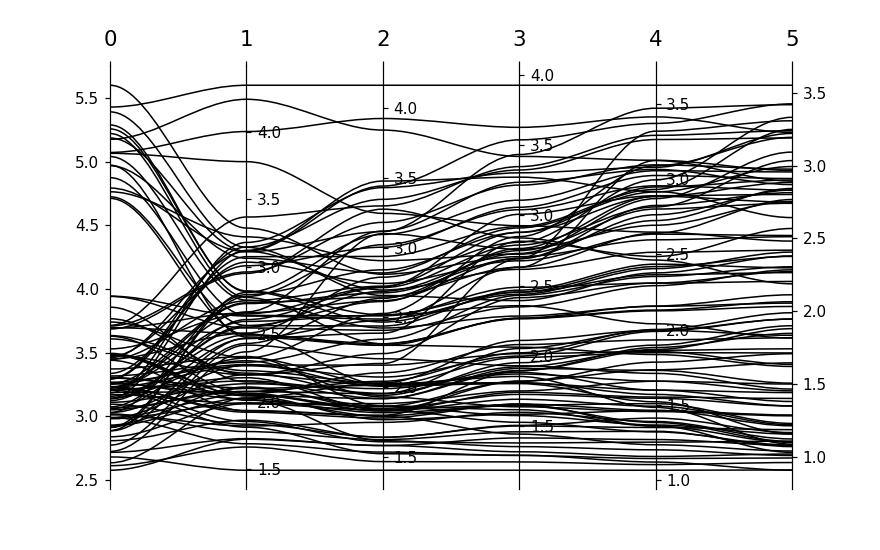

In [363]:
util.plot_parallel_coords(score.t().numpy(), );

In [ ]:
crit = score[1:].sub(score[:-1])

In [364]:
gold = crit.lt(0).prod(0).bool()
# gold = score[1:].sub(score[:-1]).mean(0).lt(0).bool()
gold.float().mean()

tensor(0.5800)

<IPython.core.display.Javascript object>


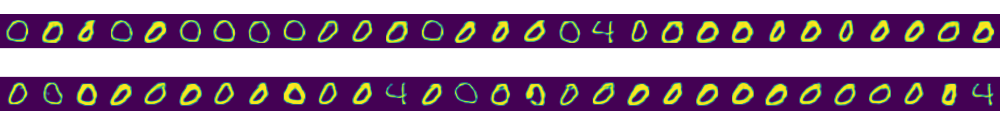

In [365]:
util.plot_imgs(D(cands[gold]));

In [ ]:
gold = score[1:].sub(score[:-1]).mean(0).lt(0).prod(0).bool()

In [383]:
from controller import GMM, LatentResponse

In [386]:
za.shape

torch.Size([8, 24])

In [459]:
gmm = GMM(encode=E, decode=D, n_components=2, covariance_type='full', )
gmm

GMM()

In [460]:
gmm.fit_latent(za)

<IPython.core.display.Javascript object>


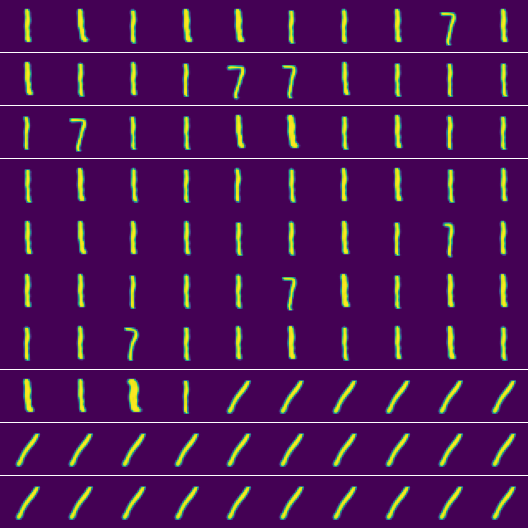

In [461]:
util.plot_imgs(gmm.sample(100));

<IPython.core.display.Javascript object>


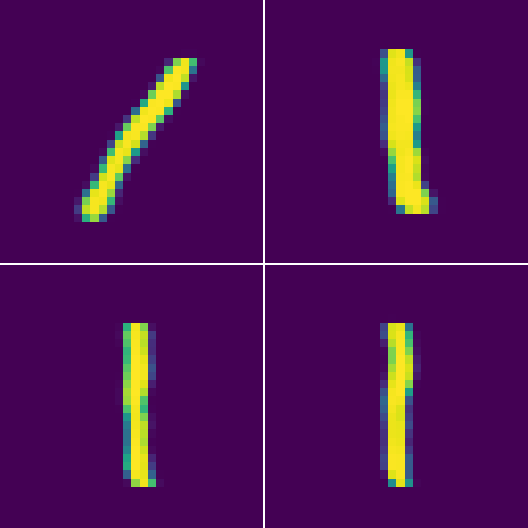

In [462]:
util.plot_imgs(D(za));

In [478]:
lr = LatentResponse(encode=E, decode=D, temp=0.2, levels=5, n_neighbors=4, only_core=False, max_size=512, )

In [479]:
lr.fit_latent(za)

<IPython.core.display.Javascript object>


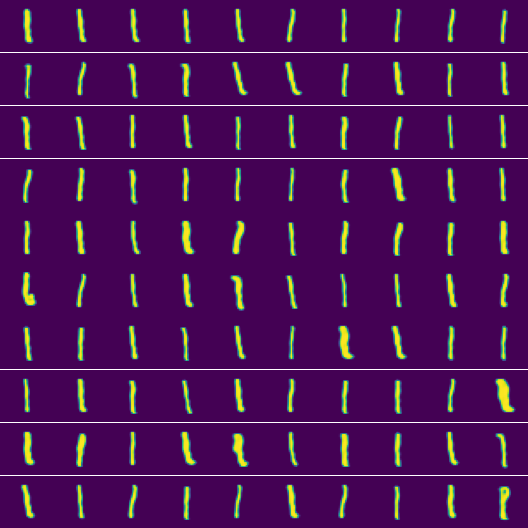

In [486]:
lz = lr.sample_latent(100)
util.plot_imgs(D(lz));

In [401]:
lr.nodes.ptr, lr.nodes.buffer.shape

(171, torch.Size([256, 24]))

In [393]:
lr.nodes.max_size

256